### Name: Lester Lim Kai Bin
### Sim ID: 10261499

<div style="text-align: center;">
    <h1>Celestial Traits: Exploring the Impact of Zodiac Signs on Personality in Everyday Life</h1>
    <h2>Project Proposal</h2>
</div>

# 1 Aims, Objective, and Background

## 1.1 Introduction

Astrology has captured humans' attention and beliefs for centuries, with many turning to their zodiac signs for guidance on personality, traits, relationships, career choices, and life decisions. Astrology has always been a global fascination as the idea of the position of celestial bodies at the time of one's birth can shape individual behaviors and characteristics. Even to this day, the influence of zodiac signs on real-life personality traits remains a mystery.

This project was inspired by my own fascination with the connection between zodiac signs and personality traits observed in real-life behavior. The primary objective is to investigate whether astrological profiling has any measurable impact on how individuals interact in real life. By surveying people and analyzing the data on their views on zodiac influence, this project aims to bridge the gap between astrology and psychology.

I aim to conduct a comprehensive examination of zodiac personality traits to assess whether certain attributes are commonly associated with each zodiac sign. By exploring this idea using Natural Language Processing (NLP) and data science techniques, I intend to visualize the data through graphs and word clouds. This could help contribute to a deeper understanding of how individuals relate to their astrological identities.

Ultimately, this research aims to offer insights into the possible psychological and cultural implications of astrology and the ways in which zodiac signs might shape our perceptions of ourselves and others.

## 1.2 Aims and Objectives

Within this project, I would like to explore the following:

- **Analyzing article content**:
  - Comparing the zodiac sign personality traits.
  - Exploring zodiac sign hobbies (using word clouds).
  - Comparing the percentage of each zodiac sign in the population.

- **Exploring the relationship between zodiac personality profiles and individuals' real-life personalities**:
  - Hobbies.
  - Personality traits.
  - Population distribution of zodiac signs.

### Specific Aims:
1. Decide how to collect real-time data from individuals.
2. Determine how much data is required to sufficiently explore the research questions, considering constraints on time and resources.
3. Clean and transform the data to make it suitable for the chosen analysis techniques.
4. Conduct exploratory data analysis to identify trends within the data for further exploration.

## 1.3 Scope of Work

The scope of this report is to investigate the relationship between zodiac signs and personality traits, hobbies, and population distribution using a combination of web-scraped astrology data and survey responses. The analysis aims to explore whether astrological profiling has any measurable impact on real-life personality traits and behaviors while examining the cultural and psychological implications of astrology.

### Inclusion Criteria:
1. **Zodiac Signs**: Includes all twelve zodiac signs to ensure comprehensive coverage of astrological profiling.
2. **Data Sources**:
   - Web-scraped data from three astrology websites: Astrotheme, Astrotalk, and Indastro.
   - Survey data collected via Google Forms for real-time insights into individual personality traits, hobbies, and beliefs in horoscopes.
3. **Personality Traits**: Focuses on the Big Five personality traits: Extraversion, Agreeableness, Conscientiousness, Neuroticism, and Openness.
4. **Hobbies**: Common hobbies associated with each zodiac sign.
5. **Population Data**: Percentage distribution of zodiac signs in the global population.
6. **Survey Respondents**: Individuals aged 18 and above.
7. **Ethical Considerations**: Uses anonymized survey data with informed consent from participants.

### Exclusion Criteria:
1. Incomplete survey responses.
2. Non-English data.
3. Outliers in population data.
4. Irrelevant hobbies.
5. Traits unrelated to personality.
6. Duplicate data.
7. Data without informed consent or requests for exclusion.

## 1.4 Data

### 1.4.1 Data Requirements
The chosen websites provide detailed information relevant to the research topic. Since there is no existing study or data on real-time individuals' personalities, I will collect my own data through a Google survey targeting 50–100 responses to ensure reliability. This approach enables a comparison between astrological profiling and real-life profiling.

Google Form Link: https://docs.google.com/forms/d/e/1FAIpQLScLBgd81mMvJRYzDPbS0N8HWSlyHjNIjzg1QIaUprKeIMtxww/viewform

### 1.4.2 Choice of Websites
Websites were chosen based on the relevance of their information:
- **Astrotheme**: Covers detailed astrology topics, including personality traits.
- **Astrotalk**: Includes personality and hobby analysis.
- **Indastro**: Provides zodiac sign population percentages.

### 1.4.4 Limitations and Constraints
- **Survey Limitations**:
  - Lack of pre-existing real-time personality/zodiac data.
  - Small sample size may reduce statistical power.
  - Sampling bias could skew the results.

## 1.5 Ethical Considerations

### 1.5.1 Use of Survey
Ethical concerns include confidentiality, privacy, and informed consent. Steps to address these include:
- **Informed Consent**: Participants are made aware of the survey’s goals and data usage.
- **Privacy**: Surveys are anonymized to ensure no personal information is used.

### 1.5.2 Use of Websites
The selected websites allow web scraping as per their terms and `robots.txt` files, which were checked for any restrictions.



#### Importing Libraries and Modules

In [1]:
# Import libraries and modules
import string
import requests
from bs4 import BeautifulSoup
import pandas as pd
import nltk
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import re
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from math import pi
from scipy.stats import f_oneway
from sklearn.preprocessing import LabelEncoder
from scipy.stats import spearmanr
from collections import Counter

# 2 Webscraping articles
## 2.1 Defining scraping and generating the neccessary link
The list of URLs to be analysed is in the code column below, I will need to define a function to generate the neccessary link to webscrape the data. AstroTheme and Astrotalk have different page identifier which would require the function to iterate through the list of page identifiers and generate the appropriate link to scrape. We will need to write three different webscrapping function as we will be using different website.

The contents below contains all the url and a list of page identifiers required to webscrape data:

In [2]:
#URL for AstroTheme
url_perhobby = "https://www.astrotheme.com/" 

#URL for Astrotalk
url_astrotalk = "https://astrotalk.com/astrology-blog/what-are-the-personality-traits-of-each-zodiac-sign-insideastro-iatr7/"

#URL for percentage of each zodiac in the population
url_percentage = "https://www.indastro.com/astrology-articles/most-common-zodiac-sign-to-least-common-zodiac-sign.html"

## Generating the link Astrotheme to webscrape
The following functions generate the required link for webscraping, the goal is to dynamically constuct urls based on a base url and a list of specific page identifiers correlating to each specific zodiac sign. This function is mainly used for Astrotheme to collect the data about personalities, hobbies.

In [3]:
def getLink(url):
    response = requests.get(url)
    if response.status_code == 200:
        soup = BeautifulSoup(response.content, 'html.parser')
    
        links = soup.find_all("a")
        urls = []
        count = 0
        for link in links:
            href = link.get('href')
            if href and "zodiac-sign.php" in href:
                if count < 12:
                    print(href)
                    count += 1
                    urls.append(href)
        return urls
    else:
        print(f"Failed to retrieve the webpage. Status code: {response.status_code}")

## 2.2 Status check and extraction functions
The function below checks if the webpage is accessible and allows us to webscrape and return the content if it is: 

In [4]:
def getStatus (url):
    #check if the status is 200 to allow the webscraping
    status = requests.get(url).status_code
    if status == 200:
        return print("Request was successful")
    else:
        return print("Request was unsuccessful")

## Extracting data from Astrotheme
The following function extracts the personality (good/bad) and hobbies from the webpage. We will also be checking if the data scraped is correct:

In [5]:
def extractAstrotheme(url, zodiac):
    #dictionary dictionary to pass the different values based on the zodiac
    zodiac_heading = {
        "aries": {
            "personality": "Aries' sayings and key-words",
            "hobbies": "The sign of Aries and its hobbies"
        },
        "taurus": {
            "personality": "Taurus' sayings and key-words",
            "hobbies": "The sign of Taurus and its hobbies"
        },
        "gemini": {
            "personality": "Gemini' sayings and key-words",
            "hobbies": "The sign of Gemini and its hobbies"
        },
        "cancer": {
            "personality": "Cancer' sayings and key-words",
            "hobbies": "The sign of Cancer and its hobbies"
        },
        "leo": {
            "personality": "Leo' sayings and key-words",
            "hobbies": "The sign of Leo and its hobbies"
        },
        "virgo": {
            "personality": "Virgo' sayings and key-words",
            "hobbies": "The sign of Virgo and its hobbies"
        },
        "libra": {
            "personality": "Libra' sayings and key-words",
            "hobbies": "The sign of Libra and its hobbies"
        },
        "scorpio": {
            "personality": "Scorpio' sayings and key-words",
            "hobbies": "The sign of Scorpio and its hobbies"
        },
        "sagittarius": {
            "personality": "Sagittarius' sayings and key-words",
            "hobbies": "The sign of Sagittarius and its hobbies"
        },
        "capricorn": {
            "personality": "Capricorn' sayings and key-words",
            "hobbies": "The sign of Capricorn and its hobbies"
        },
        "aquarius": {
            "personality": "Aquarius' sayings and key-words",
            "hobbies": "The sign of Aquarius and its hobbies"
        },
        "pisces": {
            "personality": "Pisces' sayings and key-words",
            "hobbies": "The sign of Pisces and its hobbies"
        },

    }

    #check if the zodiac is inside the zodiac heading
    if zodiac not in zodiac_heading:
        print(zodiac, " Not found!")

    header = zodiac_heading[zodiac]
    #Check the content
    personality_content = requests.get(url)
    #personality_content.text
    
    #Parse text into soup using beautiful soup to allow me to efficiently and reliably navigate and
    #extract data from the website
    soup_personality = BeautifulSoup(personality_content.text, "html.parser")


    #function to locate the paragraph and scrap it from the website
    def extract_p(text, min_p, max_p):
        header = soup_personality.find('h2', string = text)
        if not header:
            return print(text , "not found")
        header_subtext = header.find_next_siblings('p')[min_p:max_p]

        return [p.text.strip() for p in header_subtext]

    #scraping personality paragraph from the website
    personality_text = extract_p(header["personality"], 1, 3)

    #if loop to append the scrapped data into the list based on zodiac
    if zodiac == "aries":
        for p in personality_text:
            aries.append(p)
    elif zodiac == "taurus":
        for p in personality_text:
            taurus.append(p)
    elif zodiac == "gemini":
        for p in personality_text:
            gemini.append(p)
    elif zodiac == "cancer":
        for p in personality_text:
            cancer.append(p)
    elif zodiac == "leo":
        for p in personality_text:
            leo.append(p)
    elif zodiac == "virgo":
        for p in personality_text:
            virgo.append(p)
    elif zodiac == "libra":
        for p in personality_text:
            libra.append(p)
    elif zodiac == "scorpio":
        for p in personality_text:
            scorpio.append(p)
    elif zodiac == "sagittarius":
        for p in personality_text:
            sagi.append(p)
    elif zodiac == "capricorn":
        for p in personality_text:
            capri.append(p)
    elif zodiac == "aquarius":
        for p in personality_text:
            aquar.append(p)
    elif zodiac == "pisces":
        for p in personality_text:
            pisces.append(p)

    #scrapping hobbies paragraph from the website
    hobbies_text = extract_p(header["hobbies"], 0, 1)

    if zodiac == "aries":
        for p in hobbies_text:
            aries.append(p)
    elif zodiac == "taurus":
        for p in hobbies_text:
            taurus.append(p)
    elif zodiac == "gemini":
        for p in hobbies_text:
            gemini.append(p)
    elif zodiac == "cancer":
        for p in hobbies_text:
            cancer.append(p)
    elif zodiac == "leo":
        for p in hobbies_text:
            leo.append(p)
    elif zodiac == "virgo":
        for p in hobbies_text:
            virgo.append(p)
    elif zodiac == "libra":
        for p in hobbies_text:
            libra.append(p)
    elif zodiac == "scorpio":
        for p in hobbies_text:
            scorpio.append(p)
    elif zodiac == "sagittarius":
        for p in hobbies_text:
            sagi.append(p)
    elif zodiac == "capricorn":
        for p in hobbies_text:
            capri.append(p)
    elif zodiac == "aquarius":
        for p in hobbies_text:
            aquar.append(p)
    elif zodiac == "pisces":
        for p in hobbies_text:
            pisces.append(p)

## Extracting data from Indastro
The following function extracts information about the percentage of each zodiac in a population. We will also be checking if the data scraped is correct:

In [6]:
def extract_indastro(url, zodiac):
    #Check the content
    percentage_content = requests.get(url)
    
    #Parse text into soup using beautiful soup to allow me to efficiently and reliably navigate and
    #extract data from the website
    soup_percentage = BeautifulSoup(percentage_content.text, "html.parser")

    #scrapping all the <h3> from the website
    headers = soup_percentage.find_all("h3")

    #Check whether each <h3> contains the Zodiac name
    header = None
    for i in headers:
        if zodiac.capitalize() in i.get_text(strip=True):
            header = i
            break

    #if zodiac is not found
    if not header:
        return print(zodiac, " not found on the page.")
    #find the <p> below the title
    paragraph = header.find_next_sibling('p')

    #get the text from the paragraph
    percent_text = paragraph.get_text(strip=True)

    #if loop to append the scrapped data based on zodiac sign
    if zodiac == "aries":
        aries.append(percent_text)
    elif zodiac == "taurus":
        taurus.append(percent_text)
    elif zodiac == "gemini":
        gemini.append(percent_text)
    elif zodiac == "cancer":
        cancer.append(percent_text)
    elif zodiac == "leo":
        leo.append(percent_text)
    elif zodiac == "virgo":
        virgo.append(percent_text)
    elif zodiac == "libra":
        libra.append(percent_text)
    elif zodiac == "scorpio":
        scorpio.append(percent_text)
    elif zodiac == "sagittarius":
        sagi.append(percent_text)
    elif zodiac == "capricorn":
        capri.append(percent_text)
    elif zodiac == "aquarius":
        aquar.append(percent_text)
    elif zodiac == "pisces":
        pisces.append(percent_text)

## Extracting data from Astrotalk
The following function extracts information about the personality of each zodiac signs. We will also be checking if the data scraped is correct:


In [7]:
def extract_Astrotalk(url, zodiac):
    personality_content = requests.get(url)
    #personality_content.text
    
    #Parse text into soup using beautiful soup to allow me to efficiently and reliably navigate and
    #extract data from the website
    soup_personality = BeautifulSoup(personality_content.text, "html.parser")


    #function to locate the paragraph and scrap it from the website
    def extract_p(zodiac):
        header = soup_personality.find('h2', string=lambda text: text and zodiac.capitalize() in text)

        #this is to check if the header can be found, if it is found. The data will be scraped
        if not header:
            return print(zodiac, " not found on the page.")

        next_sibling = header.find_next_sibling('p')
        header_text = next_sibling.find_next_sibling('p')


        return header_text.get_text(strip=True)

    
    #scraping personality paragraph from the website
    personality_text = extract_p(zodiac)
    
    if zodiac == "aries":
        aries.append(personality_text)
    elif zodiac == "taurus":
        taurus.append(personality_text)
    elif zodiac == "gemini":
        gemini.append(personality_text)
    elif zodiac == "cancer":
        cancer.append(personality_text)
    elif zodiac == "leo":
        leo.append(personality_text)
    elif zodiac == "virgo":
        virgo.append(personality_text)
    elif zodiac == "libra":
        libra.append(personality_text)
    elif zodiac == "scorpio":
        scorpio.append(personality_text)
    elif zodiac == "sagittarius":
        sagi.append(personality_text)
    elif zodiac == "capricorn":
        capri.append(personality_text)
    elif zodiac == "aquarius":
        aquar.append(personality_text)
    elif zodiac == "pisces":
        pisces.append(personality_text)

## 2.2 Generating URLs and scrape data
### 2.2.1 Creating the neccessary list for all the zodiac signs
Now we have defined all the functions we are going to use, we will be get the required link and load it into a dataframe and upload into a CSV. The list created below is used to append the information into the appropriate zodiac signs

In [8]:
#List to store all the data
#the reason why I put the zodiac sign in each unique zodiac list is to fill up the column 
#to tell the difference for each zodiac in the excel
aries = ["Aries"]
taurus = ["Taurus"]
gemini = ["Gemini"]
cancer = ["Cancer"]
leo = ["Leo"]
virgo = ["Virgo"]
libra = ["Libra"]
scorpio = ["Scorpio"]
sagi = ["Sagittarius"]
capri = ["Capricorn"]
aquar = ["Aquarius"]
pisces = ["Pisces"]

zodiac_data = {
    'aries': aries,
    'taurus': taurus,
    'gemini': gemini,
    'cancer': cancer,
    'leo': leo,
    'virgo': virgo,
    'libra': libra,
    'scorpio': scorpio,
    'sagittarius': sagi,
    'capricorn': capri,
    'aquarius': aquar,
    'pisces': pisces
}

#create a list to for loop through each zodiac while it scrapes
zodiac_sign = ["aries", "taurus", "gemini", "cancer", "leo", "virgo", "libra", "scorpio", "sagittarius",
               "capricorn", "aquarius", "pisces"]

### 2.2.2 Check the status for all 3 websites

In [9]:
#getting the status for Astrotalk
print("Astrotalk")
Astrotalk = getStatus(url_astrotalk)

#getting the status for Astrotheme
print("AstroTheme")
Astrotheme = getStatus(url_perhobby)

#getting the status for Indastro
print("Indastro")
Indastro = getStatus(url_percentage)

Astrotalk
Request was successful
AstroTheme
Request was successful
Indastro
Request was successful


### 2.2.2 Scrape Astrotalk and save into the required list
Next we will attempt to scrape the neccessary information from Astrotalk and append it to the list created at 2.2.1. I will be doing a check to ensure the the information was appeneded into the list.

In [10]:
#using the extract function to scrape the information and appends it into the lists 
#for loop iterates through the zodiac_sign list, going through each zodiac
for i in zodiac_sign:
    extract_Astrotalk(url_astrotalk, i)


#### Check and see if the data appended into the each zodiac list:
I have created a disctionary and a list to loop through, ensuring that all the data was successfully scraped

In [11]:
# Loop through each sign and check if astrotalk was scraped successfully and appeneded
for sign in zodiac_sign:
    if len(zodiac_data[sign]) == 2:
        print(f"{sign} information was successfully scraped from Astrotalk")
    else:
        print(f"{sign} information was not successfully scraped")

aries information was successfully scraped from Astrotalk
taurus information was successfully scraped from Astrotalk
gemini information was successfully scraped from Astrotalk
cancer information was successfully scraped from Astrotalk
leo information was successfully scraped from Astrotalk
virgo information was successfully scraped from Astrotalk
libra information was successfully scraped from Astrotalk
scorpio information was successfully scraped from Astrotalk
sagittarius information was successfully scraped from Astrotalk
capricorn information was successfully scraped from Astrotalk
aquarius information was successfully scraped from Astrotalk
pisces information was successfully scraped from Astrotalk


### 2.2.4 Scrape AstroTheme and save into the required list
Next we will attempt to scrape the neccessary information from Astrotheme and append it to the list created at 2.2.1. I will be doing a check to ensure the the information was appeneded into the list.

In [12]:
#using the getlink function to get each url link
zodiac_urls = getLink(url_perhobby)

#using the extract function to scrape the information and appends it into the lists 
#var count to loop through the same value as zodiac_sign
count = 0
for i in zodiac_sign:
    extractAstrotheme(zodiac_urls[count], i)
    count += 1

https://www.astrotheme.com/aries-zodiac-sign.php
https://www.astrotheme.com/taurus-zodiac-sign.php
https://www.astrotheme.com/gemini-zodiac-sign.php
https://www.astrotheme.com/cancer-zodiac-sign.php
https://www.astrotheme.com/leo-zodiac-sign.php
https://www.astrotheme.com/virgo-zodiac-sign.php
https://www.astrotheme.com/libra-zodiac-sign.php
https://www.astrotheme.com/scorpio-zodiac-sign.php
https://www.astrotheme.com/sagittarius-zodiac-sign.php
https://www.astrotheme.com/capricorn-zodiac-sign.php
https://www.astrotheme.com/aquarius-zodiac-sign.php
https://www.astrotheme.com/pisces-zodiac-sign.php


#### Check and see if the data appended into the each zodiac list:

In [13]:
# Loop through each sign and check if astrotheme was scraped successfully and appeneded
for sign in zodiac_sign:
    if len(zodiac_data[sign]) == 5:
        print(f"{sign} information was successfully scraped from Astrotheme")
    else:
        print(f"{sign} information was not successfully scraped")

aries information was successfully scraped from Astrotheme
taurus information was successfully scraped from Astrotheme
gemini information was successfully scraped from Astrotheme
cancer information was successfully scraped from Astrotheme
leo information was successfully scraped from Astrotheme
virgo information was successfully scraped from Astrotheme
libra information was successfully scraped from Astrotheme
scorpio information was successfully scraped from Astrotheme
sagittarius information was successfully scraped from Astrotheme
capricorn information was successfully scraped from Astrotheme
aquarius information was successfully scraped from Astrotheme
pisces information was successfully scraped from Astrotheme


### 2.2.4 Scrape Indastro and save into the required list
Next we will attempt to scrape the neccessary information from Indastro and append it to the list created at 2.2.1. I will be doing a check to ensure the the information was appeneded into the list.

In [14]:
#using the extract function to scrape the information and appends it into the lists 
#for loop iterates through the zodiac_sign list, going through each zodiac
for i in zodiac_sign:
    extract_indastro(url_percentage, i)


#### Check and see if the data appended into the each zodiac list:

In [15]:
# Loop through each sign and check if indastro was scraped successfully and appeneded
for sign in zodiac_sign:
    if len(zodiac_data[sign]) == 6:
        print(f"{sign} information was successfully scraped from Indastro")
    else:
        print(f"{sign} information was not successfully scraped")

aries information was successfully scraped from Indastro
taurus information was successfully scraped from Indastro
gemini information was successfully scraped from Indastro
cancer information was successfully scraped from Indastro
leo information was successfully scraped from Indastro
virgo information was successfully scraped from Indastro
libra information was successfully scraped from Indastro
scorpio information was successfully scraped from Indastro
sagittarius information was successfully scraped from Indastro
capricorn information was successfully scraped from Indastro
aquarius information was successfully scraped from Indastro
pisces information was successfully scraped from Indastro


### 2.2.5 Saving scraped data into a dataframe
Next we will append all the zodiac sign's data into a list. we will then create a dataframe and insert the list created into the dataframe (creating our dataset to analyse) 

In [16]:
#appending all the zodiac sign data into a list
#list to contain all the zodiac sign's data
all_zodiac = []

#using the extend() function to append all the zodiac list into all_zodiac
all_zodiac.extend([aries, taurus, gemini, cancer, leo, virgo, libra, scorpio, sagi, capri, aquar, pisces])

#### Append all_zodiac list into the dataframe
Now we will create a dataframe and append the data into the data frame with a for loop:

In [17]:
#Create columns name for the dataset.
Columns = ['Zodiac Sign', 'Astrotalk Personalities', 'Good Traits', 'Bad Traits', 'Hobbies', '% of population']

#creating dataframe
df = pd.DataFrame(columns=Columns)

#appending zodiac data into dataframe
for i, row in enumerate(all_zodiac):
    df.loc[i] = row

In [18]:
df

,Zodiac Sign,Astrotalk Personalities,Good Traits,Bad Traits,Hobbies,% of population
0,Aries,"As the first sign of the zodiac, Aries represe...","Aries is courageous, frank, enthusiastic, dyna...","But sometimes it is also naive, domineering, s...","If your sign is Aries, activities which imply ...",Aries people make up 8.1% of the population. T...
1,Taurus,Taureans are known for their steadfast and rel...,"Taurus is faithful, constant, sturdy, patient,...","But sometimes it is also stubborn, rigid, poss...","If your sign is Taurus, you belong to the cate...",Taurus people make up 8.3% of the population a...
2,Gemini,"Represented by the twins, Gemini is an air sig...","The sign of Gemini is expressive, lively, adap...","But sometimes it is also capricious, scattered...","If your sign is Gemini, you appreciate it very...","At 9.3% of the population, Gemini’s are full o..."
3,Cancer,"Cancer, ruled by the moon, is a water sign kno...","The sign of Cancer is emotional, sentimental, ...","But sometimes it is also timorous, unrealistic...","If your sign is Cancer, one of your first cent...",Cancer sign make up 8.5% of the population. Ca...
4,Leo,"Leos, represented by the majestic lion, are ru...","The sign of Leo is proud, determined, strong-w...","But sometimes it is also domineering, vain, su...","If your sign is Leo, you are similar to Taurus...",Leos make up 7.1% of the population. They love...
5,Virgo,Virgos are known for their analytical and deta...,"The sign of Virgo is brainy, perspicacious, in...","But sometimes it is narrow-minded, calculating...","If your sign is Virgo, you are obviously drawn...","Virgos make up 9.4% of the world population, a..."
6,Libra,"Represented by the scales, Libra is an air sig...","The sign of Libra is sentimental, charming, po...","But sometimes it is hesitant, weak, indecisive...","If your sign is Libra, you are a Venusian pers...",Libras make up 8.8% of the population and they...
7,Scorpio,"Scorpio, ruled by Pluto and Mars, is a water s...","The sign of Scorpio is secretive, powerful, do...","But sometimes it is aggressive, destructive, s...","If your sign is Scorpio, sport is often your f...",A total of 9.6% of the population in the world...
8,Sagittarius,"Sagittarius, ruled by Jupiter, is a fire sign ...","The sign of Sagittarius is charismatic, fiery,...","But sometimes it is angry, egotistical, author...","If your sign is Sagittarius, you are hyperacti...",The Sagittarius group accounts for only 7.3% o...
9,Capricorn,Capricorns are known for their ambitious and d...,"The sign of Capricorn is serious, cold, discip...","But sometimes it is curt, withdrawn, calculati...","If your sign is Capricorn, solitude and calm f...","Comprising 8.2% of the population, Capricorns ..."


#### Put dataframe into excelsheet
After this we will put the dataframe into an excelsheet to store the data and prepare the data for other task like data cleaning.

In [19]:
#sedning the dataframe into an excelsheet
df.to_excel('ZodiacProfillingRawData.xlsx', index=False)

### 2.2.6 Consideration of Other Dataset
<p>I have found a dataset for zodiac sign from excelejt link: https://exceljet.net/formulas/zodiac-sign-lookup. The data is not useable as it only contains the basic knowledge on zodiac signs, it does not have in-depth data I can work use for deeper analysis.</p>
The other dataset that I have found is from AstroExcel link: https://astroexcel.wordpress.com/about/download/. The excel sheet is in the file but it does not contain any data within my scope of work. Hence I have decided to scrape the data above and create my own dataset. This is so I am able to have an accurate and reliable analysis.

In [20]:
excelejt = pd.read_excel("excelejt.xlsx")
excelejt

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16
0,NaN,Zodiac sign lookup,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,VLOOKUP,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,Sign,English,Symbol,Start,End,NaN,DOB,NaN,NaN,NaN,NaN,NaN,NaN,Start,Sign,Symbol
3,NaN,Aries,Ram,♈,Mar 21,Apr 19,NaN,1971-04-26 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,1.01,Aries,♑
4,NaN,Taurus,Bull,♉,Apr 20,May 20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.2,Taurus,♒
5,NaN,Gemini,Twins,♊,May 21,Jun 20,NaN,Taurus,NaN,NaN,NaN,NaN,Taurus,NaN,2.19,Gemini,♓
6,NaN,Cancer,Crab,♋,Jun 21,Jul 22,NaN,♉,NaN,NaN,NaN,NaN,♉,NaN,3.21,Cancer,♈
7,NaN,Leo,Lion,♌,Jul 23,Aug 22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.2,Leo,♉
8,NaN,Virgo,Maiden,♍,Aug 23,Sep 22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.21,Virgo,♊
9,NaN,Libra,Scales,♎,Sep 23,Oct 22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.21,Libra,♋


# 3 Data cleaning and processing
Different analysis techniques will need versions of data with different type of processing:
- Need full corpora, including stopwords, for sentiment and emotional analysis. We will be using the survey's data to do this analysis </li>
- Need version of from the scrapped data without stopwords, stemmed or lemmatized for techniques to explore topics and key points of discussion. </li>

In [21]:
#Reading the ZodiacProfillingRawData.xlsx
raw_df = pd.read_excel("ZodiacProfillingRawData.xlsx")

#Reading the rawSurveyData
raw_survey_df = pd.read_csv('rawSurveyData.csv')
#stripping the columns title so it is easier to call the column when data cleaning
raw_survey_df.columns = raw_survey_df.columns.str.strip()

In [22]:
raw_df.head()

,Zodiac Sign,Astrotalk Personalities,Good Traits,Bad Traits,Hobbies,% of population
0,Aries,"As the first sign of the zodiac, Aries represe...","Aries is courageous, frank, enthusiastic, dyna...","But sometimes it is also naive, domineering, s...","If your sign is Aries, activities which imply ...",Aries people make up 8.1% of the population. T...
1,Taurus,Taureans are known for their steadfast and rel...,"Taurus is faithful, constant, sturdy, patient,...","But sometimes it is also stubborn, rigid, poss...","If your sign is Taurus, you belong to the cate...",Taurus people make up 8.3% of the population a...
2,Gemini,"Represented by the twins, Gemini is an air sig...","The sign of Gemini is expressive, lively, adap...","But sometimes it is also capricious, scattered...","If your sign is Gemini, you appreciate it very...","At 9.3% of the population, Gemini’s are full o..."
3,Cancer,"Cancer, ruled by the moon, is a water sign kno...","The sign of Cancer is emotional, sentimental, ...","But sometimes it is also timorous, unrealistic...","If your sign is Cancer, one of your first cent...",Cancer sign make up 8.5% of the population. Ca...
4,Leo,"Leos, represented by the majestic lion, are ru...","The sign of Leo is proud, determined, strong-w...","But sometimes it is also domineering, vain, su...","If your sign is Leo, you are similar to Taurus...",Leos make up 7.1% of the population. They love...


In [23]:
raw_survey_df.head()

,Timestamp,Do you believe in horoscope,What is your zodiac sign,What are your hobbies? (one or more) (please dont answer with sleeping) :(,"How do you typically feel in social situations (e.g., parties, gatherings)?",Do you prefer spending time alone or with others?,How do you generally approach new experiences or challenges?,How do you feel when faced with stressful situations?,"When something goes wrong, how do you usually react?","How often do you feel a deep emotional connection to others (friends, family, or pets)?","When working on a project or task, how do you prefer to organize your time?",How do you feel about competition?,Do you prefer to lead a team or work behind the scenes?,How do you handle conflicts with others?,"When interacting with people, how likely are you to express your emotions openly?","How do you feel about helping others, even when it’s inconvenient for you?","How important is it for you to try new things (e.g., travel, hobbies, experiences)?","When faced with a difficult problem, how do you usually solve it?","If you could describe your personality in three words, what would they be?",What do you value most in your relationships with others?
0,2024/12/11 9:03:08 AM GMT+8,No,Gemini ( May 21 - June 21),"Painting, Gaming, Planning Hangouts",I feel comfortable but prefer smaller groups.,I enjoy being around people as much as possible.,I take time to think things through before com...,I may feel anxious at first but manage to hand...,I stay composed and quickly look for a solution.,Almost always—I’m very in tune with others’ em...,"I’m flexible, but I try to stick to a rough plan.",I prefer to avoid competition and focus on col...,"I’m comfortable either way, depending on the s...",I avoid conflict but will address it if necess...,I express my emotions freely and openly.,"I’m always willing to help, no matter what.",I love trying new things and thrive on variety.,"I look for practical, well-established methods...","Bubbly, Ambivert, Loving",Quality time and thoughtfulness
1,2024/12/11 9:41:28 AM GMT+8,Yes,Cancer ( June 22 - July 22 ),"Reading, playing games",I feel comfortable but prefer smaller groups.,I like a balance of time alone and with others.,I tend to avoid change or anything that feels ...,I often feel overwhelmed or anxious in stressf...,I get frustrated but eventually calm down and ...,Almost always—I’m very in tune with others’ em...,I tend to do things last minute or follow a sp...,I don’t mind competition as long as it’s frien...,I prefer to support others and avoid being in ...,I avoid conflict but will address it if necess...,I express my emotions but carefully consider t...,"I help when I can, but I have limits.",I enjoy trying new things occasionally but als...,I come up with creative or unconventional solu...,"Sensitive, romantic, caring",I value companionship in a relationship
2,2024/12/11 9:54:34 AM GMT+8,No,Aries ( March 21 - April 19 ),"Gaming, parkour, exercise",I feel comfortable but prefer smaller groups.,I like a balance of time alone and with others.,I take time to think things through before com...,I may feel anxious at first but manage to hand...,I get frustrated but eventually calm down and ...,Sometimes—I connect deeply but it depends on t...,I tend to do things last minute or follow a sp...,I don’t mind competition as long as it’s frien...,"I’m comfortable either way, depending on the s...",I face them directly and try to resolve them i...,I express my emotions freely and openly.,"I help when I can, but I have limits.",I enjoy trying new things occasionally but als...,I come up with creative or unconventional solu...,"Loud, weird, annoying",Genuineness
3,2024/12/11 10:03:34 AM GMT+8,Yes,Cancer ( June 22 - July 22 ),Watching movies,I feel comfortable but prefer smaller groups.,I prefer being alone or in quiet settings.,I take time to think things through before com...,I may feel anxious at first but manage to hand...,I get frustrated but eventually calm down and ...,Someti

In [24]:
#data from survey that needs to be cleaned
survey_zodiac = raw_survey_df[raw_survey_df.columns[2]]
survey_hobbies = raw_survey_df[raw_survey_df.columns[3]]
survey_personality = raw_survey_df[raw_survey_df.columns[18]]
survey_value = raw_survey_df[raw_survey_df.columns[19]]

## 3.1 Tokenise the data
we will be tokenizating the data first as it is one of the most cruical step in many NLP taks. It will split a string of texts into singular words. The purpose is to breakdown texts to make it easier for machine learning tasks

In [25]:
#we will be using the punkt package to use the nlkt tokenizers
nltk.download('punkt')
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Lester\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\Lester\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [26]:
def tokenization(data):
    #list to store all the tokenized data
    token_list = []
    #iterate through data
    for i in data:
        #tokenize the each list
        token = nltk.word_tokenize(i)
        #appends it into token_list
        token_list.append(token)
    return token_list

In [27]:
#tokanizing the raw scraped data
token_Astrotalk = tokenization(raw_df['Astrotalk Personalities'])
token_good = tokenization(raw_df['Good Traits'])
token_bad = tokenization(raw_df['Bad Traits'])
token_hobbies = tokenization(raw_df['Hobbies'])

#tokenizing the raw survey data
token_survey_value = tokenization(survey_value)
token_survey_personality = tokenization(survey_personality)
token_survey_hobbies = tokenization(survey_hobbies)

## 3.2 Remove Punctuation
The folllowing function will remove punctuations from the data:

In [28]:
def rem_punctuation(data):
    #list to store all the data after punctuation
    punct_list = []
    #iterate through the data
    for i in data:
        #add the word to the list if the value contains alphebert
        punct = [word for word in i if word.isalpha()]
        #appends into punct_list
        punct_list.append(punct)
    return punct_list

In [29]:
#removing punctuations from the tokenized scrape data
punct_Tokens_Astrotalk = rem_punctuation(token_Astrotalk)
punct_Tokens_good = rem_punctuation(token_good)
punct_Tokens_bad = rem_punctuation(token_bad)
punct_Tokens_hobbies = rem_punctuation(token_hobbies)

#removing punctuation from the tokenized survey data
punct_token_survey_value = rem_punctuation(token_survey_value)
punct_token_survey_personality = rem_punctuation(token_survey_personality)
punct_token_survey_hobbies = rem_punctuation(token_survey_hobbies)

## 3.3 Removing stop words
We need to remove all the stop words that are considered redundant in order to have a more accurate result when analysing. This is to focus on important words and improve the accuracy. 
<p>The function below removes the basic stopwords from nltk:</p>

In [30]:
#downloading the stopwords library in english
stop_words = stopwords.words('english')
#adding more stopwords that might come out on surveys
stopwords_survey = ["NIL", 'nil',"bot", "enemy","laner", "ganging", "feeding", "laners", "homeless", "an", "mid","possess"]
for i in stopwords_survey:
    stop_words.append(i)

print(stop_words)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [31]:
def stopword(data):
    #list to store the data without stopwords
    stopword_list = []
    #iterate through data
    for i in data:
        #remove all the words that's contained in stop_words list
        cleaned = [word for word in i if not word.lower() in stop_words ]
        stopword_list.append(cleaned)
    return stopword_list

In [32]:
#removing basic stopwords from scrapped data
stopwords_removed_Astrotalk = stopword(punct_Tokens_Astrotalk)
stopwords_removed_good = stopword(punct_Tokens_good)
stopwords_removed_bad = stopword(punct_Tokens_bad)
stopwords_removed_hobbies = stopword(punct_Tokens_hobbies)

#removing basic stopwords from survey data
stopwords_removed_survey_value = stopword(punct_token_survey_value)
stopwords_removed_survey_personality = stopword(punct_token_survey_personality)
stopwords_removed_survey_hobbies = stopword(punct_token_survey_hobbies)

## 3.4 Lemmatization
This function below will determine the lemma of a word based on its intended, reducing the words back to the base form

In [33]:
#initialize lemmatizer
lemmatizer = WordNetLemmatizer()

def lematization(data):
    #list to stoare the lemmatized words.
    lema_list = []
    #iterate through data
    for i in data:
        #changing all the words back to its based form
        cleaned = [lemmatizer.lemmatize(word) for word in i]
        #appends into lema_list
        lema_list.append(cleaned)
    return lema_list

In [34]:
#lemmatizing scraped data
lemmatized_astrotalk = lematization(stopwords_removed_Astrotalk)
lemmatized_good = lematization(stopwords_removed_good)
lemmatized_bad = lematization(stopwords_removed_bad)
lemmatized_hobbies = lematization(stopwords_removed_hobbies)

#lammatizing survey data
lemmatized_survey_value = lematization(stopwords_removed_survey_value)
lemmatized_survey_personality = lematization(stopwords_removed_survey_personality)
lemmatized_survey_hobbies = lematization(stopwords_removed_survey_hobbies)

## 3.5 Data cleaning for personality traits, hobbies, zodiac and percentage for the scraped data
I will be using various pre-processing techniques to clean the data effectively and accurately. This will give me a more reliable analysis.

As for the survey data, it is relatively clean enough to do data analysis on without skewing the result. Hence, I have decided to run the data through the functions below. It might cause the data to lose important values.

### Data cleaning for personality traits
#### Removing all the redundant words that are not personality traits
the function filters the list further using Part-of-Speech (POS) tagging and a combination of adjective and noun extraction. It will filter adjectives that likely describe personality traits and nouns that represent abstract qualities. There will be a manual filter to remove non-personality-related nouns such as names of planets or astrological signs, words that are irrelevant to the trait we want. This is the best approach as WordNet-based filtering did not return any results which might be because many personality traits are not directly linked to 'personality" or "trait" categories in Wordnet. Hence, creating a stopword list to filter is the best way to clean the data efficiently.

In [35]:
#ensure you have the necessary NLTK data
nltk.download('averaged_perceptron_tagger')

def personality_trait(data):
    personality_list = []
    for i in data:
        #tokenize the words and tag them with POS
        tags = nltk.pos_tag(i)
        
        #extract adjectives (JJ, JJR, JJS) and nouns (NN, NNS) that might indicate personality traits
        adjectives_and_traits = [word for word, tag in tags if tag in ['JJ', 'JJR', 'JJS', 'NN', 'NNS']]
        #stopwords for redundant
        stopwords = ['first','zodiac','planet', 'sign', 'mars', 'venus', 'moon', 'earth', 'jupiter', 'neptune', 'aries', 'pisces',
                    'taurus', 'gemeni', 'cancer', 'leo', 'virgo', 'libra', 'scorpio', 'sagittarius', 'capricorns', 'aquarius', 'taureans', 'value', 'twins', 'air', 'others', 'water', 'fire', 'sun', 'solar','system','such',
                    'need', 'water']
        
        #filter adjectives and nouns to check if they match personality traits
        filtered_keywords = [word for word in adjectives_and_traits if word.lower() not in stopwords]
    
        personality_list.append(filtered_keywords)
    return personality_list

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Lester\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [36]:
#cleaning all the personality
cleaned_astrotalk = personality_trait(lemmatized_astrotalk)
cleaned_good = personality_trait(lemmatized_good)
cleaned_bad = personality_trait(lemmatized_bad)
cleaned_hobbies = personality_trait(lemmatized_hobbies)

### Data cleaning for hobbies
The function below will further clean the hobbies data and return only the hobbies for each zodiac signs. This can be done by filtering our irrelevant words such as adjectives, verbs and other non-activity terms and identifying the activities from each list

In [37]:
def extract_hobbies(data):
    hobbies = []
    for sign in data:
        #extract activities from the list (they are usually the last items in the list)
        activities_start_index = 0
        
        #find the start index of hobbies/activities (after the first few elements)
        for i, word in enumerate(sign):
            if word.lower() == 'activity':
                activities_start_index = i + 1
                break
        
        #extract the activities
        hobbies_for_sign = sign[activities_start_index:]
        
        #filter out words that are not actual hobbies (like 'sign' and 'activity')
        hobbies_for_sign = [hobby for hobby in hobbies_for_sign if hobby.isalpha()]
        
        hobbies.append(hobbies_for_sign)
    
    return hobbies

In [38]:
cleaned_hobbies_v2 = extract_hobbies(cleaned_hobbies)

### Data cleaning for percentage of each zodiac in a population
The function to extract just the percentage numbers from your list of lists which contains words as well as numbers, I am going to  use regular expressions to extract the numbers that are followed by the percentage symbol:

In [39]:
def extract_percentages(data):
    percentages = []
    
    for i in data:
        #find all occurrences of percentages (numeric values followed by %)
        matches = re.findall(r'(\d+\.\d+|\d+)\s*%', i)
        
        #append percentage into a list
        percentages.extend(matches)
    
    return percentages


In [40]:
cleaned_percent = extract_percentages(raw_df['% of population'])

### Data cleaning for the zodiac sign (for the survey data)
the codes below will remove all the dates from the data, leaving the zodiac sign (from Aries ( March 21 - April 19 ) to Aries):

In [41]:
#by using regex, to extract the first word ending at a space
cleaned_survey_zodiac = survey_zodiac.str.extract(r'^\s*([A-Za-z]+)')

### Data preprocess survey questions data
Now I will subsitude all the answers based on (A,B,C) for better analysis and mapping the scores to each answer. The function below will map the answers to each letter

In [42]:
#columns to process
columns_to_process = [raw_survey_df.columns[4], 
                      raw_survey_df.columns[5],
                      raw_survey_df.columns[6],
                      raw_survey_df.columns[7],
                      raw_survey_df.columns[8],
                      raw_survey_df.columns[9],
                      raw_survey_df.columns[10],
                      raw_survey_df.columns[11],
                      raw_survey_df.columns[12],
                      raw_survey_df.columns[13],
                      raw_survey_df.columns[14],
                      raw_survey_df.columns[15],
                      raw_survey_df.columns[16],
                      raw_survey_df.columns[17],]

#designated mapping all the questions and alphabet
fixed_mapping = {
    raw_survey_df.columns[4]: {'I feel energized and enjoy interacting with people.': 'A', 'I feel comfortable but prefer smaller groups.': 'B', 'I feel drained and prefer solitude.': 'C'}, 
    raw_survey_df.columns[5]: {'I enjoy being around people as much as possible.': 'A', 'I like a balance of time alone and with others.': 'B', 'I prefer being alone or in quiet settings.': 'C'},
    raw_survey_df.columns[6]: {'I embrace them enthusiastically and jump right in.': 'A', 'I take time to think things through before committing.': 'B', 'I tend to avoid change or anything that feels uncertain.': 'C'},
    raw_survey_df.columns[7]: {'I stay calm and tackle the problem head-on.': 'A', 'I may feel anxious at first but manage to handle it.': 'B', 'I often feel overwhelmed or anxious in stressful situations.': 'C'},
    raw_survey_df.columns[8]: {'I stay composed and quickly look for a solution.': 'A', 'I get frustrated but eventually calm down and solve the issue.': 'B', 'I tend to feel upset for a long time and struggle to recover quickly.': 'C'},
    raw_survey_df.columns[9]: {'Almost always—I’m very in tune with others’ emotions.': 'A', 'Sometimes—I connect deeply but it depends on the situation.': 'B', 'Rarely—I tend to keep a bit of emotional distance from others.': 'C'},
    raw_survey_df.columns[10]: {'I like to plan things meticulously and follow a schedule.': 'A', 'I’m flexible, but I try to stick to a rough plan.': 'B', 'I tend to do things last minute or follow a spontaneous approach.': 'C'},
    raw_survey_df.columns[11]: {'I enjoy it and thrive in competitive environments.': 'A', 'I don’t mind competition as long as it’s friendly and fair.': 'B', 'I prefer to avoid competition and focus on collaboration instead.': 'C'},
    raw_survey_df.columns[12]: {'I like to take charge and lead whenever possible.': 'A', 'I’m comfortable either way, depending on the situation.': 'B', 'I prefer to support others and avoid being in the spotlight.': 'C'},
    raw_survey_df.columns[13]: {'I face them directly and try to resolve them immediately.': 'A', 'I avoid conflict but will address it if necessary.': 'B', 'I tend to stay quiet and hope the issue resolves itself.': 'C'},
    raw_survey_df.columns[14]: {'I express my emotions freely and openly.': 'A', 'I express my emotions but carefully consider the situation.': 'B', 'I keep my emotions private and rarely express them.': 'C'},
    raw_survey_df.columns[15]: {'I’m always willing to help, no matter what.': 'A', 'I help when I can, but I have limits.': 'B', 'I tend to prioritize my own needs over helping others.': 'C'},
    raw_survey_df.columns[16]: {'I love trying new things and thrive on variety.': 'A', 'I enjoy trying new things occasionally but also value routine.': 'B', 'I prefer to stick with familiar activities and avoid the unknown.': 'C'},
    raw_survey_df.columns[17]: {'I come up with creative or unconventional solutions.': 'A', 'I look for practical, well-established methods to solve the problem.': 'B', 'I rely on others for solutions or avoid the problem altogether.': 'C'},
}

In [43]:
#replacing all the ansawers according to the fixed_mapping
raw_survey_df[columns_to_process] = raw_survey_df[columns_to_process].replace(fixed_mapping)

In [44]:
raw_survey_df


,Timestamp,Do you believe in horoscope,What is your zodiac sign,What are your hobbies? (one or more) (please dont answer with sleeping) :(,"How do you typically feel in social situations (e.g., parties, gatherings)?",Do you prefer spending time alone or with others?,How do you generally approach new experiences or challenges?,How do you feel when faced with stressful situations?,"When something goes wrong, how do you usually react?","How often do you feel a deep emotional connection to others (friends, family, or pets)?","When working on a project or task, how do you prefer to organize your time?",How do you feel about competition?,Do you prefer to lead a team or work behind the scenes?,How do you handle conflicts with others?,"When interacting with people, how likely are you to express your emotions openly?","How do you feel about helping others, even when it’s inconvenient for you?","How important is it for you to try new things (e.g., travel, hobbies, experiences)?","When faced with a difficult problem, how do you usually solve it?","If you could describe your personality in three words, what would they be?",What do you value most in your relationships with others?
0,2024/12/11 9:03:08 AM GMT+8,No,Gemini ( May 21 - June 21),"Painting, Gaming, Planning Hangouts",B,A,B,B,A,A,B,C,B,B,A,A,A,B,"Bubbly, Ambivert, Loving",Quality time and thoughtfulness
1,2024/12/11 9:41:28 AM GMT+8,Yes,Cancer ( June 22 - July 22 ),"Reading, playing games",B,B,C,C,B,A,C,B,C,B,B,B,B,A,"Sensitive, romantic, caring",I value companionship in a relationship
2,2024/12/11 9:54:34 AM GMT+8,No,Aries ( March 21 - April 19 ),"Gaming, parkour, exercise",B,B,B,B,B,B,C,B,B,A,A,B,B,A,"Loud, weird, annoying",Genuineness
3,2024/12/11 10:03:34 AM GMT+8,Yes,Cancer ( June 22 - July 22 ),Watching movies,B,C,B,B,B,B,B,A,C,B,B,B,B,B,"Moody, caring, sensitive",Communication
4,2024/12/11 10:36:45 AM GMT+8,No,Pisces ( February 19 - March 20 ),"Travelling, embroidery, gaming, listening musi...",B,B,B,C,B,B,B,C,C,C,B,B,B,B,"Introverted, curious, indecisive",Trust
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,2024/12/12 8:01:04 PM GMT+8,No,Scorpio ( October 24 - November 21 ),Sports and me time,B,B,B,B,B,B,A,A,C,B,C,B,C,B,Go with the flow,Quality conversations
71,2024/12/12 8:08:04 PM GMT+8,Yes,Taurus ( April 20 - May 20 ),Crocheting,B,B,C,C,B,B,B,B,B,B,B,B,B,B,Avoidance. Annoying. Conflicted,Loyalty
72,2024/12/12 8:55:13 PM GMT+8,No,Sagittarius ( November 22 - Decembe r 21 ),napping,A,B,B,B,A,B,B,B,B,B,B,B,A,B,"crazy, loud",bonds
73,2024/12/12 11:55:24 PM GMT+8,Yes,Libra ( September 23 - October 23 ),"Doing creative work, chilling with friends and...",B,B,B,A,A,A,C,C,B,A,B,B,B,B,"Creative, Calm, Quiet","Authentic, good communication!"


## 3.6 Cleaned dataframe
### 3.6.1 Create cleaned dataframe
We create a dataframe with almost the same title. I have decided to merge the good traits and bad traits scraped from Astrotheme together allows for a more streamlined dataset, as it will be inefficient to have multiple of the same column that essentially describe the same type of information. This will make the data structure simpler and easier to handle when it comes to analyzing the data later on.

In [45]:
#Create columns name for the dataset for the scraped data
scraped_Columns = ['Zodiac Sign', 'Astrotalk Personalities', 'Astrotheme Personalities', 'Hobbies', '% of population']

In [46]:
#Creating the list for all the zodiac signs to be appended into the cleaned_df later on
cleaned_data = []

#zodiac sign for each row
cleaned_aries = ["Aries"]
cleaned_taurus = ["Taurus"]
cleaned_gemini = ["Gemini"]
cleaned_cancer = ["Cancer"]
cleaned_leo = ["Leo"]
cleaned_virgo = ["Virgo"]
cleaned_libra = ["Libra"]
cleaned_scorpio = ["Scorpio"]
cleaned_sagi = ["Sagittarius"]
cleaned_capri = ["Capricorn"]
cleaned_aquar = ["Aquarius"]
cleaned_pisces = ["Pisces"]


### 3.6.2 Merging the cleaned_good and cleaned_bad
The function below will be used to merge the good traits and bad traits scraped from Astrotheme into one list.

In [47]:
def merge_traits(good_data, bad_data):
    #list to store the merged traits for Astrotheme
    merge_Astrotheme = []
    count = 0
    for i in good_data:
        merge_list = i + bad_data[count]
        merge_Astrotheme.append(merge_list)
        count += 1
    return merge_Astrotheme

In [48]:
cleaned_Astrotheme = merge_traits(cleaned_good, cleaned_bad)

### 3.6.3 Inserting cleaned data into the new dataframe
The function below will insert all the clean data that went through cleaning into the dataframe:

In [49]:
def insert_data(data):
    count = 0
    for i in data:
        if count == 0:
            cleaned_aries.append(i)
            count += 1
        elif count == 1:
            cleaned_taurus.append(i)
            count += 1
        elif count == 2:
            cleaned_gemini.append(i)
            count += 1
        elif count == 3:
            cleaned_cancer.append(i)
            count += 1
        elif count == 4:
            cleaned_leo.append(i)
            count += 1
        elif count == 5:
            cleaned_virgo.append(i)
            count += 1
        elif count == 6:
            cleaned_libra.append(i)
            count += 1
        elif count == 7:
            cleaned_scorpio.append(i)
            count += 1
        elif count == 8:
            cleaned_sagi.append(i)
            count += 1
        elif count == 9:
            cleaned_capri.append(i)
            count += 1
        elif count == 10:
            cleaned_aquar.append(i)
            count += 1
        elif count == 11:
            cleaned_pisces.append(i)
        else:
            print("There is no more data in the list")

Inserting the data into the predesinated list created at 3.6.1

In [50]:
insert_data(cleaned_astrotalk)
insert_data(cleaned_Astrotheme)
insert_data(cleaned_hobbies_v2)
insert_data(cleaned_percent)

In [51]:
#converting cleaned_data to a Dataframe
cleaned_data.extend([cleaned_aries, cleaned_taurus, cleaned_gemini, cleaned_cancer, cleaned_leo, cleaned_virgo, cleaned_libra, cleaned_scorpio, cleaned_sagi, cleaned_capri, cleaned_aquar, cleaned_pisces])

In [52]:
len(cleaned_data)

12

In [53]:
#appending zodiac data into dataframe
cleaned_df = pd.DataFrame(cleaned_data, columns=scraped_Columns)

#### Scraped Data after data cleaning

In [54]:
cleaned_df

,Zodiac Sign,Astrotalk Personalities,Astrotheme Personalities,Hobbies,% of population
0,Aries,"[adventurous, spirit, action, vitality, indivi...","[courageous, frank, enthusiastic, dynamic, fas...","[speed, degree, danger, likely, find, lot, ple...",8.1
1,Taurus,"[reliable, nature, individual, stability, secu...","[faithful, constant, sturdy, patient, tough, p...","[patience, golf, cricket, yoga, judo]",8.3
2,Gemini,"[twin, communication, intellect, curious, adap...","[expressive, adaptable, humorous, playful, soc...","[game, board, game, chess, newspaper, novel, c...",9.3
3,Cancer,"[emotional, depth, sensitivity, connected, emo...","[emotional, sentimental, peaceful, imaginative...","[centre, interest, life, curio, furniture, hou...",8.5
4,Leo,"[majestic, lion, center, radiate, warmth, conf...","[proud, loyal, generous, ambitious, courageous...","[similar, people, moment, relaxation, freedom]",7.1
5,Virgo,"[known, analytical, nature, exceptional, organ...","[perspicacious, truth, accuracy, attentive, de...","[intellectual, hobby, sport, discipline, preve...",9.4
6,Libra,"[scale, innate, sense, balance, harmony, justi...","[sentimental, polite, loyal, pacifist, fair, r...","[person, moment, leisure, violence, intense, e...",8.8
7,Scorpio,"[intensity, transformation, passionate, determ...","[secretive, powerful, resistant, intuitive, ch...","[sport, favourite, hobby, constitution, strong...",9.6
8,Sagittarius,"[adventurous, optimistic, nature, thirst, know...","[charismatic, fiery, energetic, likeable, bene...","[countless, latter, communication, skill, char...",7.3
9,Capricorn,"[ambitious, disciplined, nature, strong, work,...","[serious, cold, patient, thoughtful, ambitious...","[useless, isolate, read]",8.2


#### Converting the cleaned_dataframe into an excelsheet
This is for the markers to see the cleaned data through excelsheet. This would also allow me to preserve the dataset for future reference, audit or analysis. It is better to store it in case something goes wrong.

In [55]:
#converitng the dataframe into a excelsheet
cleaned_df.to_excel('ZodiacProfillingCleanedData.xlsx', index=False)

### 3.6.4 Creating cleaned survey dataframe
Now I will create a dataframe to store all the cleaned data as well as the raw text that does not need to be cleaned.

In [56]:
cleaned_survey_df = pd.DataFrame()

In [57]:
#create a mappings for each column
column_mapping = {
    'believe in horoscope': raw_survey_df.columns[1],
    'Zodiac Sign': cleaned_survey_zodiac,
    'Hobbies': lemmatized_survey_hobbies,
    'Q1': raw_survey_df.columns[4],
    'Q2': raw_survey_df.columns[5],
    'Q3': raw_survey_df.columns[6],
    'Q4': raw_survey_df.columns[7],
    'Q5': raw_survey_df.columns[8],
    'Q6': raw_survey_df.columns[9],
    'Q7': raw_survey_df.columns[10],
    'Q8': raw_survey_df.columns[11],
    'Q9': raw_survey_df.columns[12],
    'Q10': raw_survey_df.columns[13],
    'Q11': raw_survey_df.columns[14],
    'Q12': raw_survey_df.columns[15],
    'Q13': raw_survey_df.columns[16],
    'Q14': raw_survey_df.columns[17],
    'Personality': lemmatized_survey_personality,
    'Value to relationship with others': lemmatized_survey_value
}

# Loop through the mapping and assign values dynamically
for cleaned_col, raw_col in column_mapping.items():
    if isinstance(raw_col, str):
        # If it's a column name from the raw DataFrame, use it to extract the data
        cleaned_survey_df[cleaned_col] = raw_survey_df[raw_col]
    else:
        # If it's already a list/series (like lemmatized data), assign it directly
        cleaned_survey_df[cleaned_col] = raw_col

#### Survey Data after data cleaning

In [58]:
cleaned_survey_df

,believe in horoscope,Zodiac Sign,Hobbies,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11,Q12,Q13,Q14,Personality,Value to relationship with others
0,No,Gemini,"[Painting, Gaming, Planning, Hangouts]",B,A,B,B,A,A,B,C,B,B,A,A,A,B,"[Bubbly, Ambivert, Loving]","[Quality, time, thoughtfulness]"
1,Yes,Cancer,"[Reading, playing, game]",B,B,C,C,B,A,C,B,C,B,B,B,B,A,"[Sensitive, romantic, caring]","[value, companionship, relationship]"
2,No,Aries,"[Gaming, parkour, exercise]",B,B,B,B,B,B,C,B,B,A,A,B,B,A,"[Loud, weird, annoying]",[Genuineness]
3,Yes,Cancer,"[Watching, movie]",B,C,B,B,B,B,B,A,C,B,B,B,B,B,"[Moody, caring, sensitive]",[Communication]
4,No,Pisces,"[Travelling, embroidery, gaming, listening, mu...",B,B,B,C,B,B,B,C,C,C,B,B,B,B,"[Introverted, curious, indecisive]",[Trust]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,No,Scorpio,"[Sports, time]",B,B,B,B,B,B,A,A,C,B,C,B,C,B,"[Go, flow]","[Quality, conversation]"
71,Yes,Taurus,[Crocheting],B,B,C,C,B,B,B,B,B,B,B,B,B,B,"[Avoidance, Annoying, Conflicted]",[Loyalty]
72,No,Sagittarius,[napping],A,B,B,B,A,B,B,B,B,B,B,B,A,B,"[crazy, loud]",[bond]
73,Yes,Libra,"[creative, work, chilling, friend, family]",B,B,B,A,A,A,C,C,B,A,B,B,B,B,"[Creative, Calm, Quiet]","[Authentic, good, communication]"


In [59]:
cleaned_survey_df.to_excel('cleanedSurveyData.xlsx', index=False)

# 4 Exploratory Data Analysis
This segment of this notebook, we will be analyzing the data found with certain data analysis techniques

## 4.1 Wordclouds
We can see what personality for each zodiac sign to focus on by creating a wordcloud of the cleaned scrapped data as well as the cleaned survey data we have created earlier with all the data preprocessing techniques applied

Wordclouds is a visual representation of text data, where it shows the importance or frequency of words are represented by their size. Larger words are more significant while smaller words are less common or important. 

The function below is function to create a wordcloud with the neccessary data:

In [60]:
def wordcloud(data):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')  # Remove axes
    plt.title(i.capitalize(), fontsize=16, fontweight='bold', pad=20)
    plt.show()

### 4.1.1 These wordclouds is to visualize the zodiac sign personality
#### Wordcloud for zodiac sign profiling
The data used for the wordclouds below is the data scrapped from online, this will later be used to compare with the individual real life profiling. I have decided to put the personality traits scraped from the two website together as it will give a larger and more accurate data when creating a wordcloud

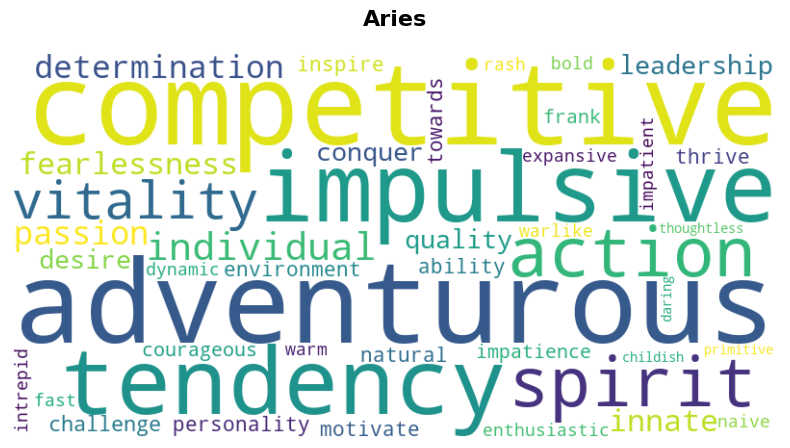

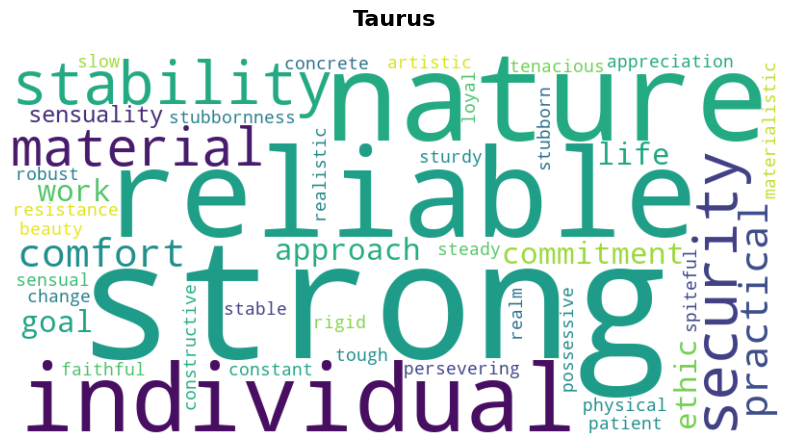

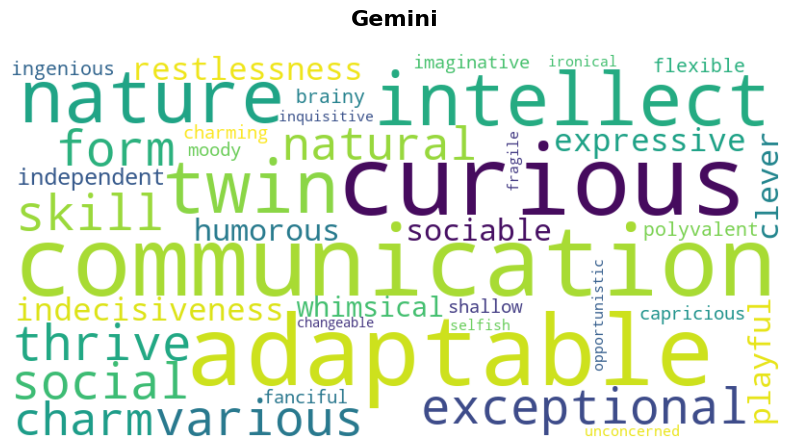

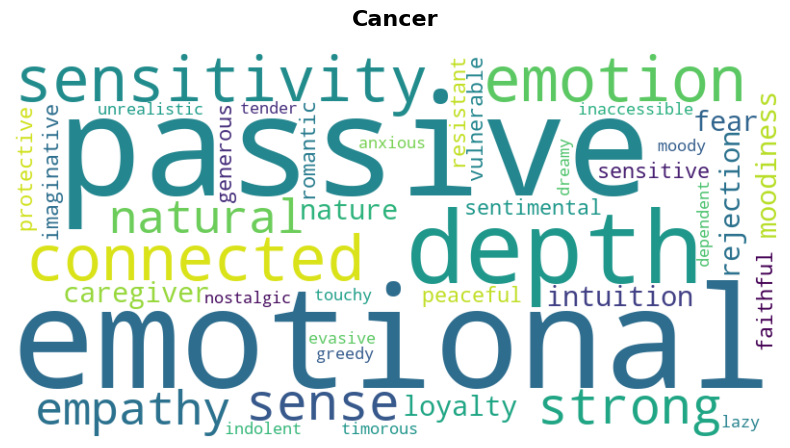

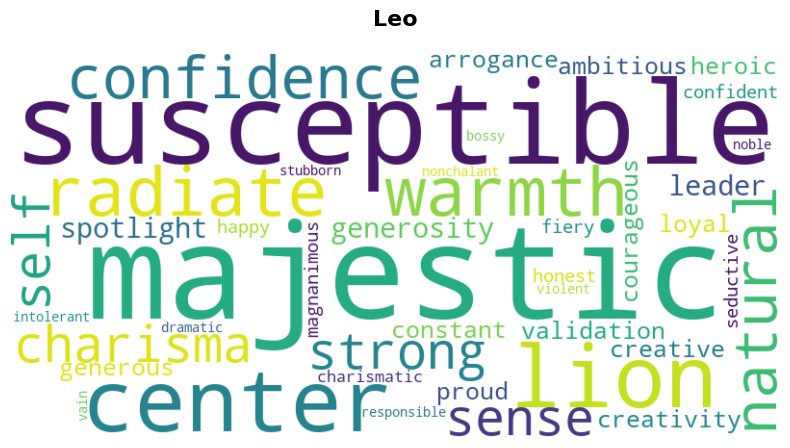

...

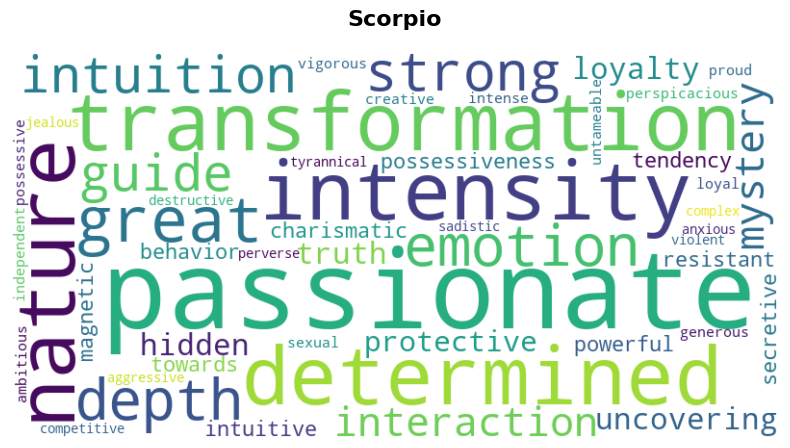

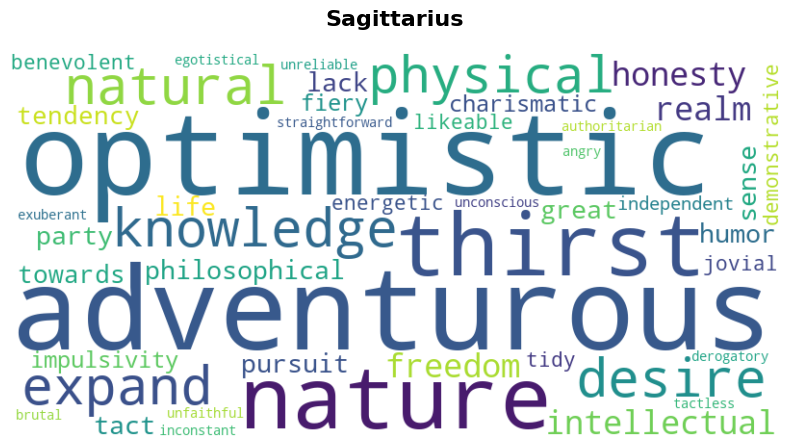

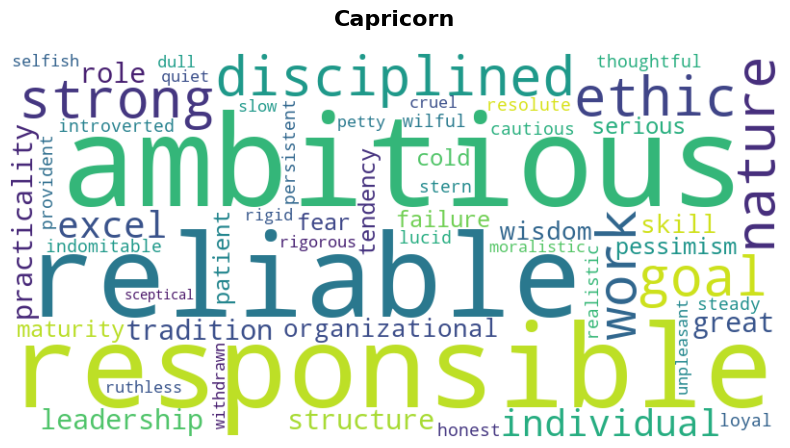

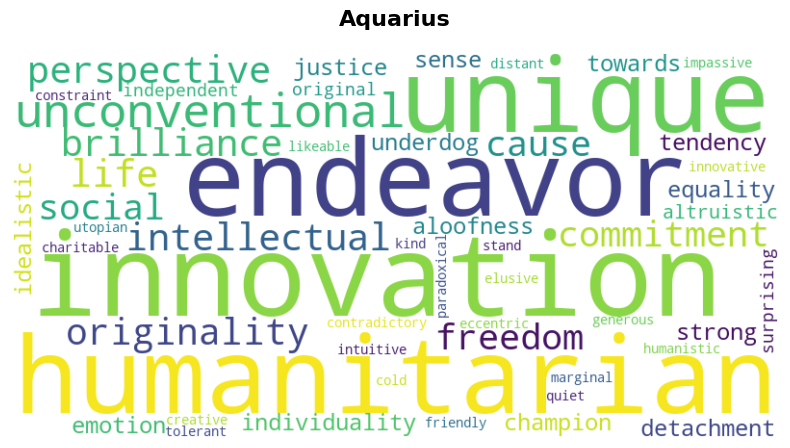

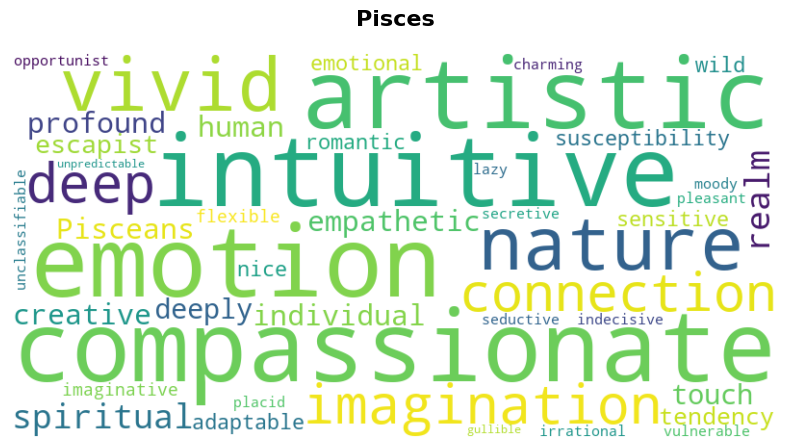

In [61]:
#filter by zodiac
for i in zodiac_sign:
    filtered_rows = cleaned_df[cleaned_df["Zodiac Sign"].str.lower() == i]
    #changing the series to list
    list_data_astrotalk = filtered_rows["Astrotalk Personalities"].tolist()
    list_data_astrotheme = filtered_rows["Astrotheme Personalities"].tolist()
    #removing the nested lsit
    flat_list_astrotalk = list_data_astrotalk[0]
    flat_list_astrotheme = list_data_astrotheme[0]
    #combining the 2 list together
    flat_list = flat_list_astrotalk + flat_list_astrotheme
    # Count the frequency of each word
    word_freq = Counter(flat_list)
    # Generate the word cloud
    wordcloud(word_freq)

#### Wordcloud for the real life personality profiling
The data used below is the data from the survey on the personality. give more insights give example

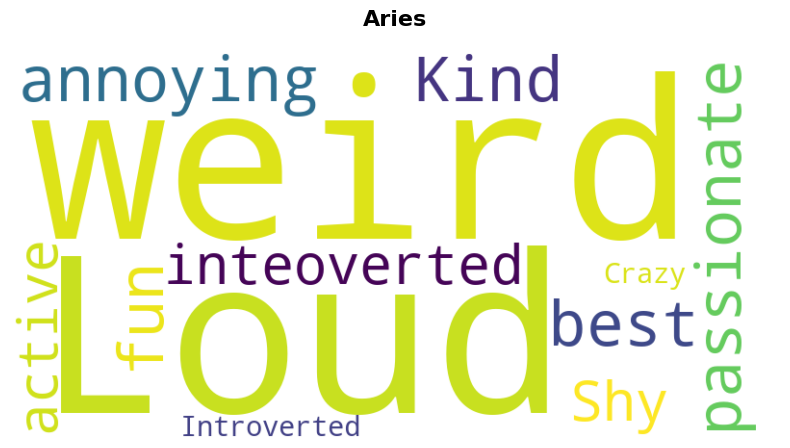

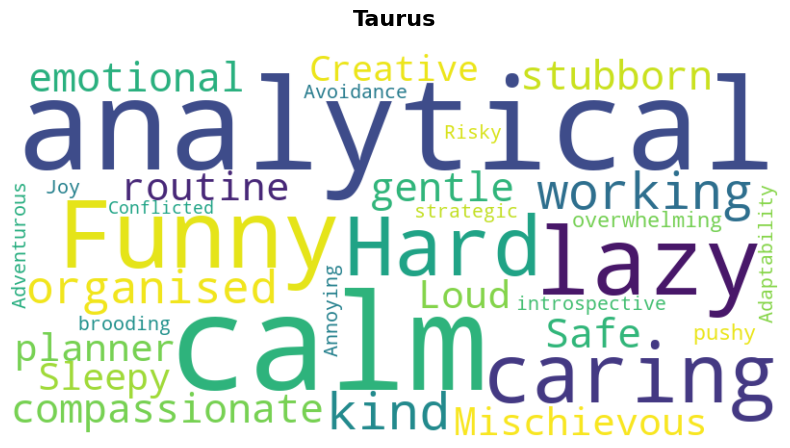

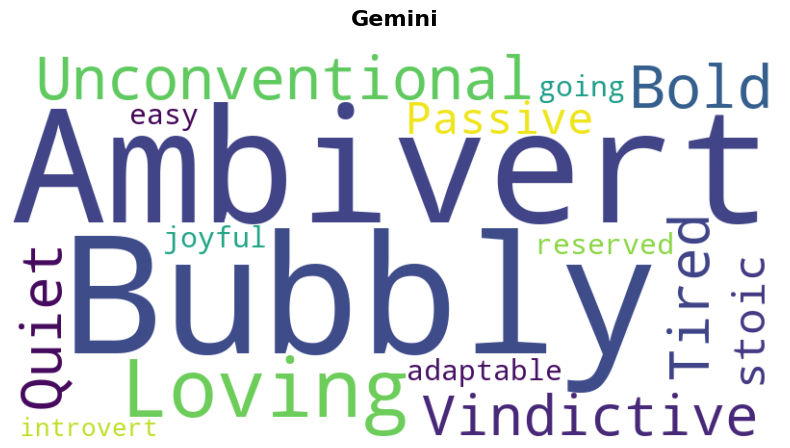

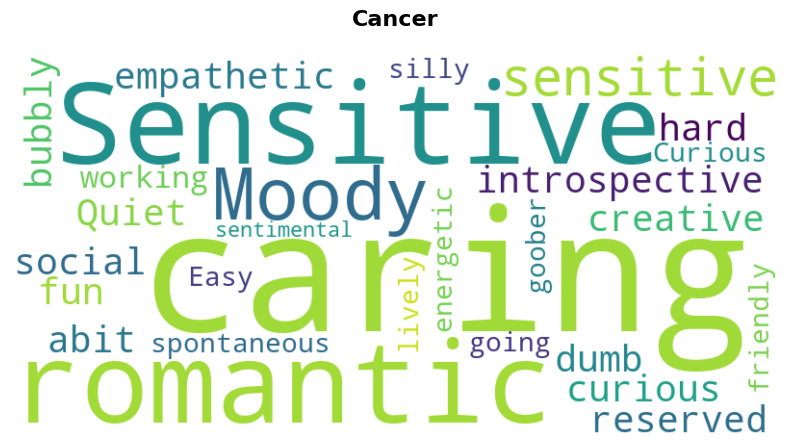

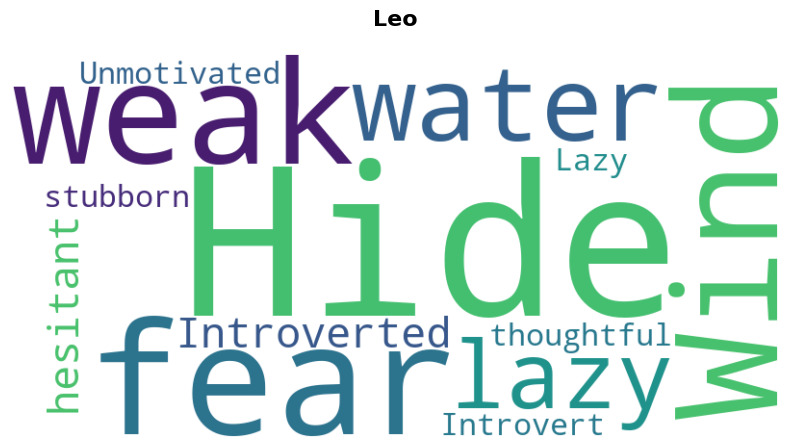

...

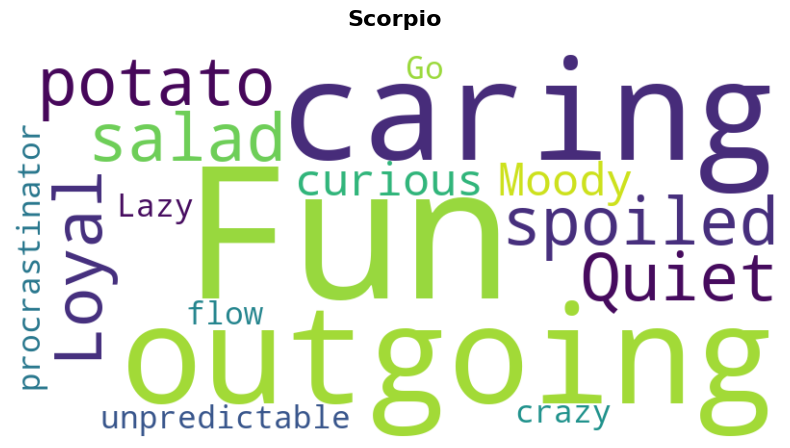

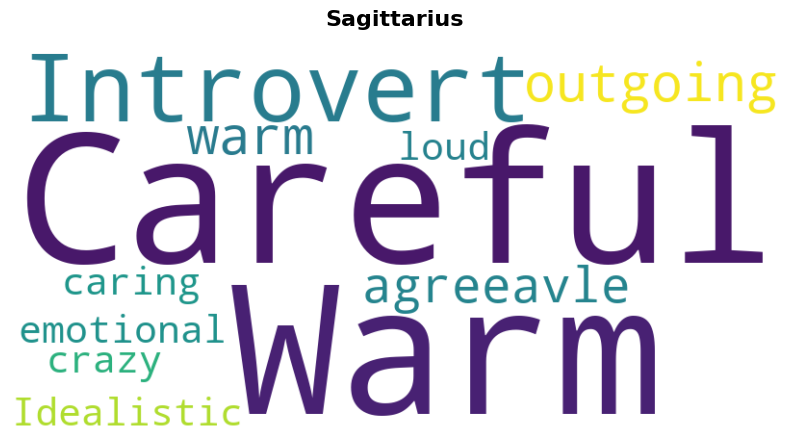

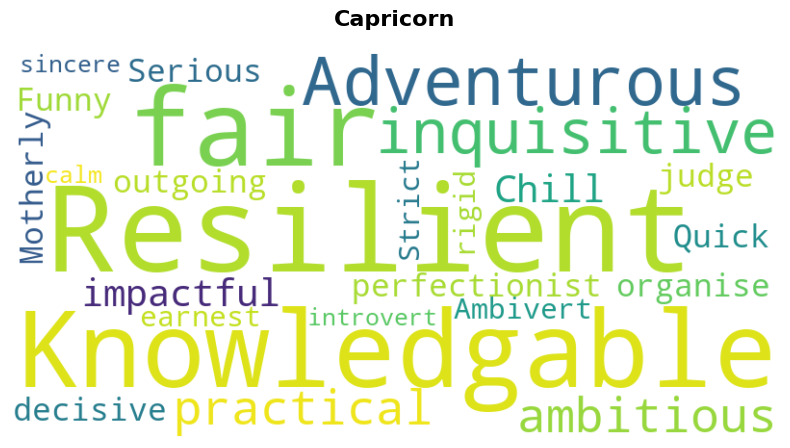

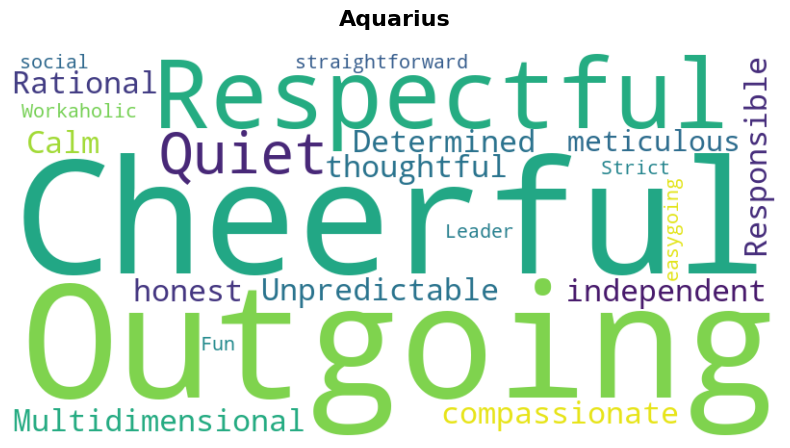

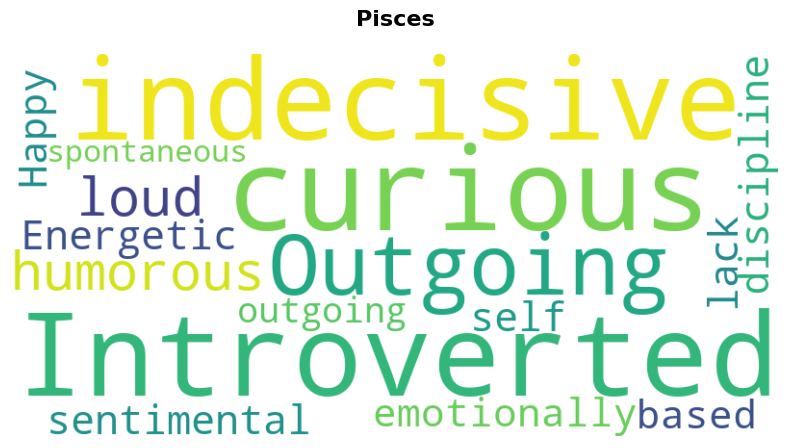

In [62]:
#filter by zodiac
for i in zodiac_sign:
    #filters the row based on zodiac sign
    filtered_rows = cleaned_survey_df[cleaned_survey_df["Zodiac Sign"].str.lower() == i]
    #changing the series to list
    list_data = filtered_rows["Personality"].tolist()
    combi_list_data = []
    for l in list_data:
        combi_list_data += l
    #count the frequency of each word
    word_freq = Counter(combi_list_data)
    #generate the word cloud
    wordcloud(word_freq)

#### Analysis:
There is strong alignment with aries, cancer, virgo and sagittarius while there is partial alignment with Taurus, Gemini, Libra, Scorpio and Aquarius. The rest of the zodiac signs are off from the zodiac sign personality profiling prediction. Due to cultural and social influence, real life traits often include modern personality descriptors like funny, lazy or ambivert which are less traditional. This makes it hard for the zodiac sign personality profiling to predict accurately. 

### 4.1.2 These wordclouds is to visualize each zodiac sign's hobbies
#### Wordcloud for zodiac sign hobbies profiling
The data used for the wordcloud below is the data scrapped from online, this will later be used to compare with the individual real life hobbies profiling.

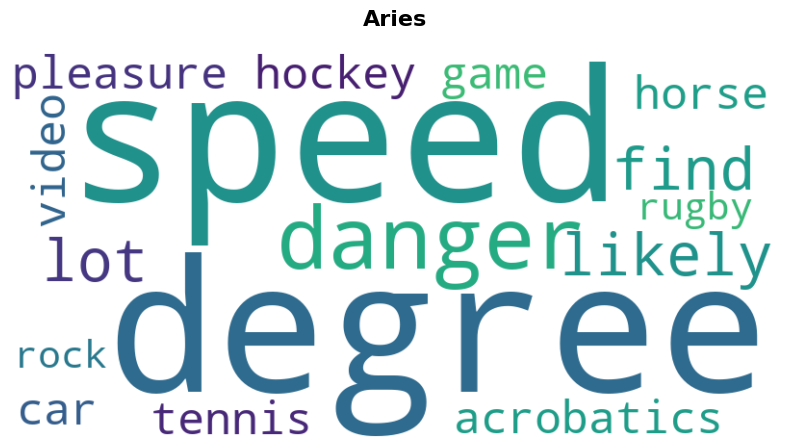

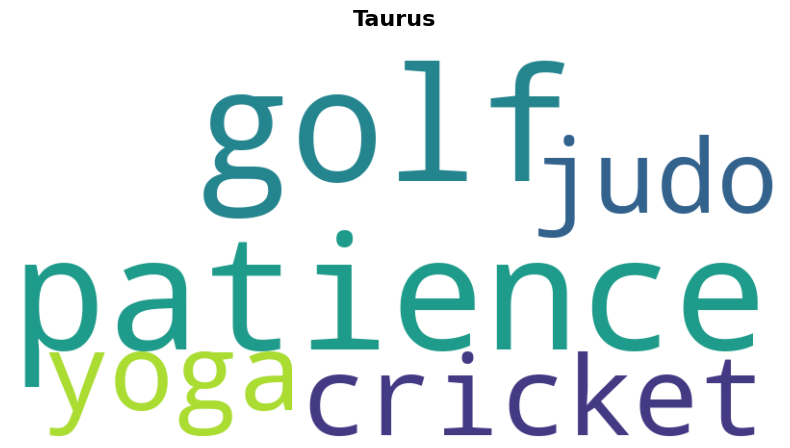

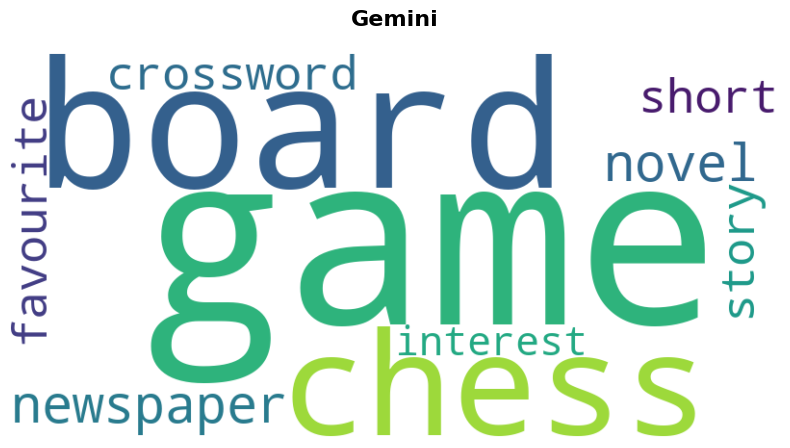

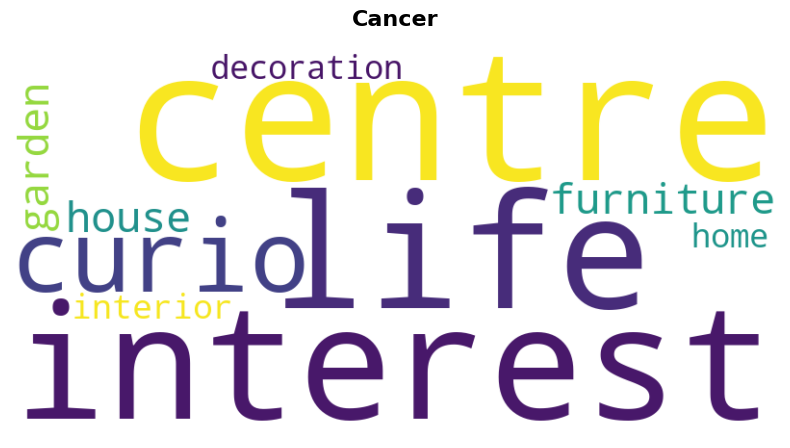

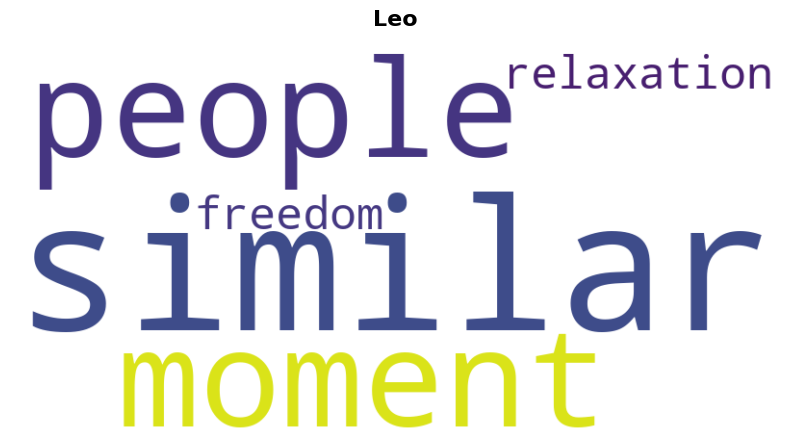

...

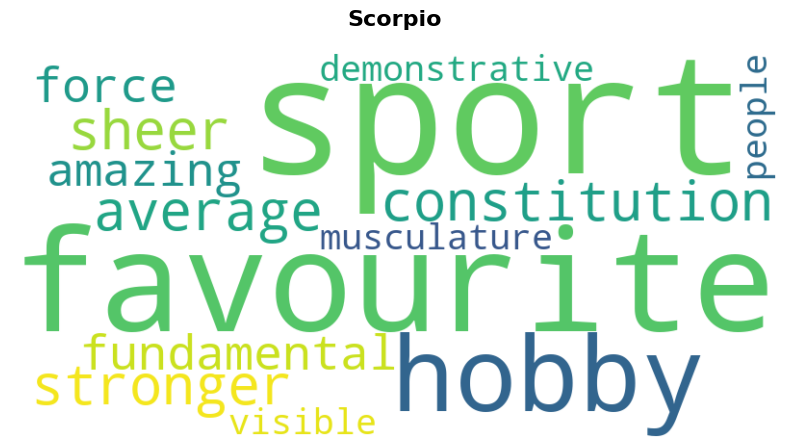

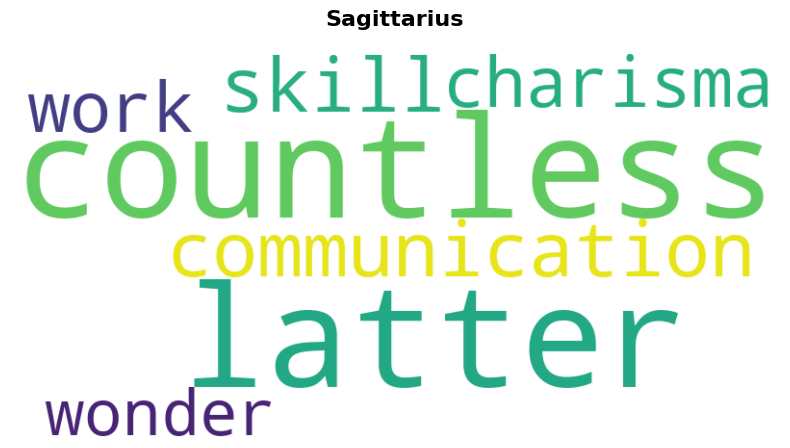

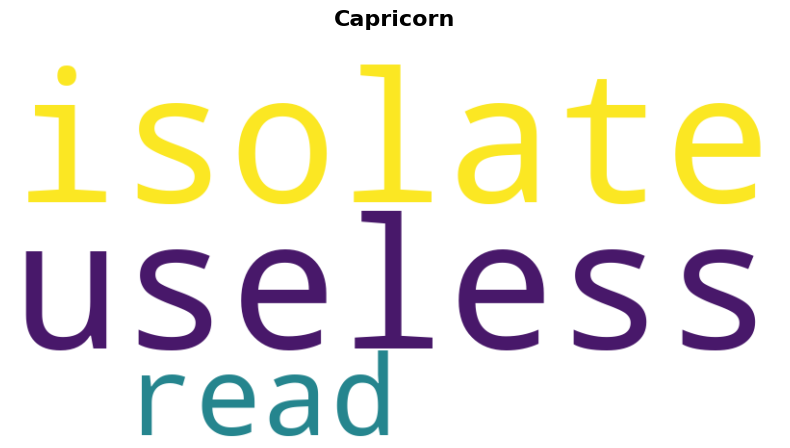

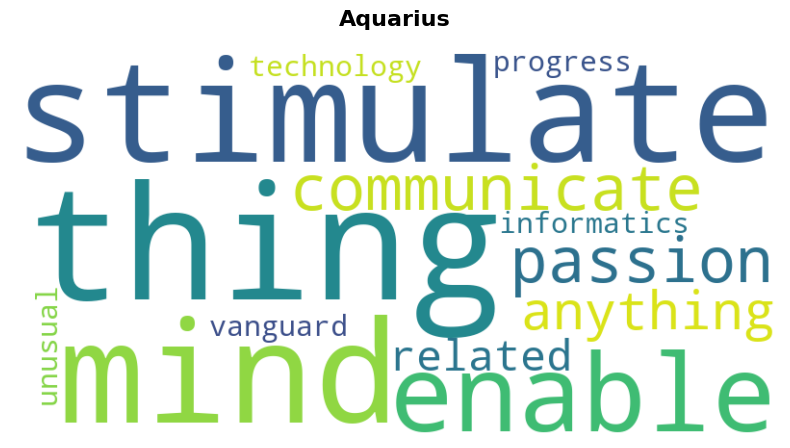

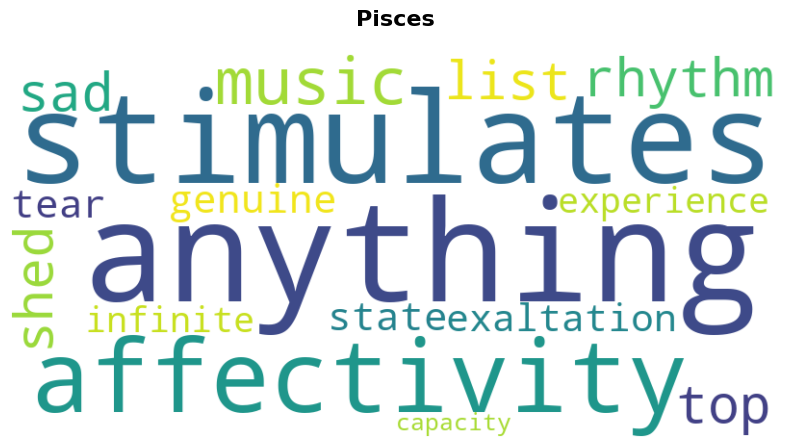

In [63]:
#filter by zodiac
for i in zodiac_sign:
    filtered_rows = cleaned_df[cleaned_df["Zodiac Sign"].str.lower() == i]
    #changing the series to list
    list_data = filtered_rows["Hobbies"].tolist()
    #removing the nested lsit
    flat_list = list_data[0]
    # Count the frequency of each word
    word_freq = Counter(flat_list)
    # Generate the word cloud
    wordcloud(word_freq)

#### Wordcloud for individual hobbies profiling
The data used for the wordcload below is the data from the survey that I have conducted. The data will be filtered based on their zodiac sign and it will collate all the hobbies together to show in the wordcloud

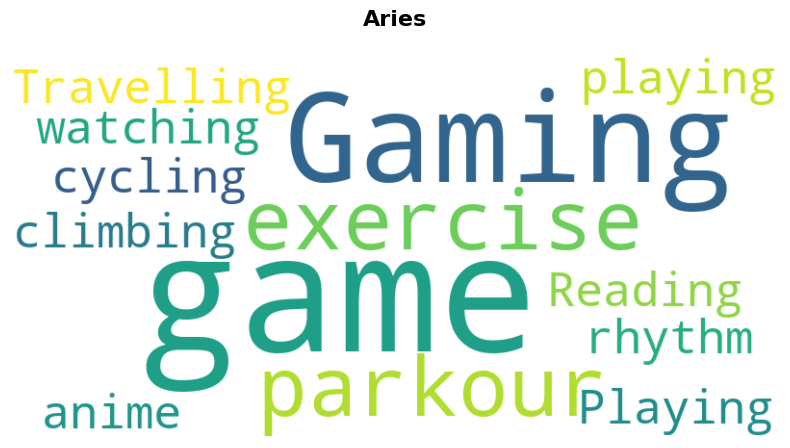

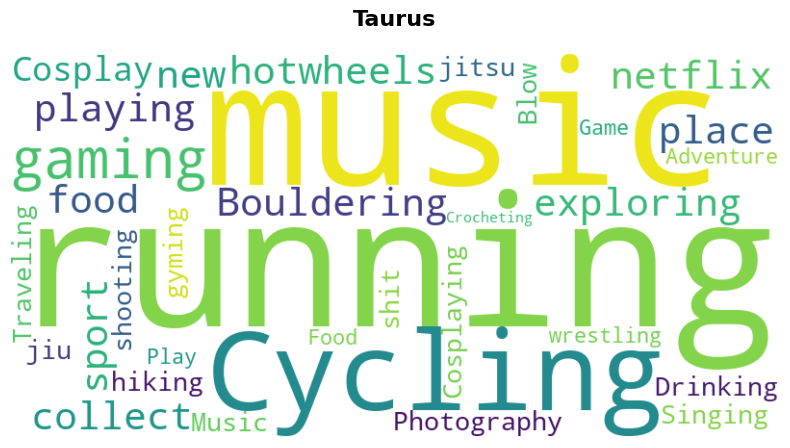

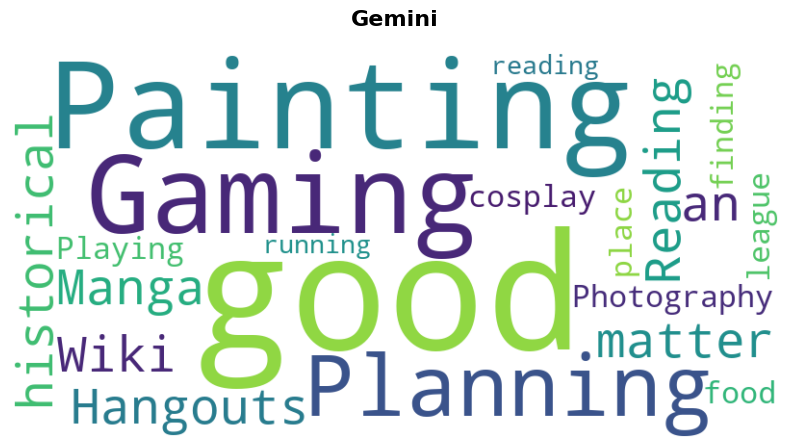

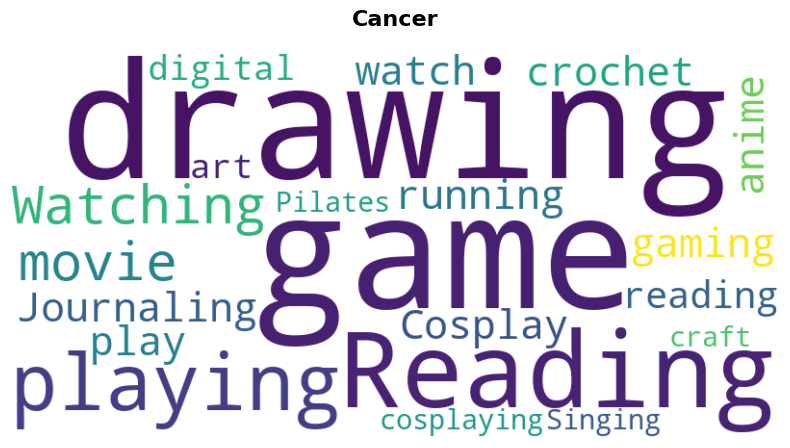

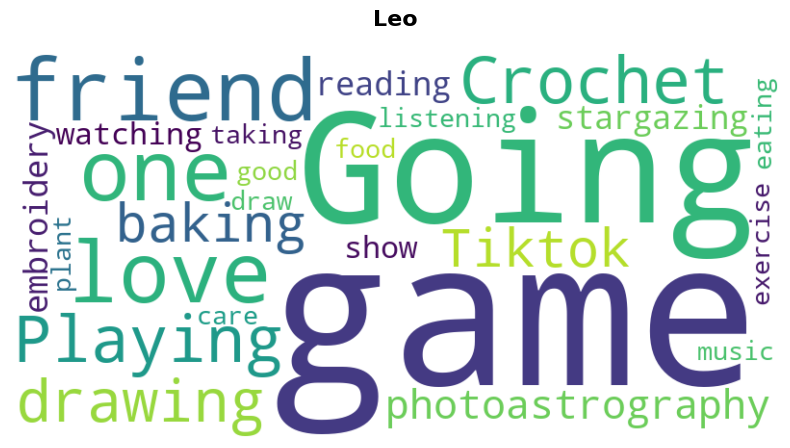

...

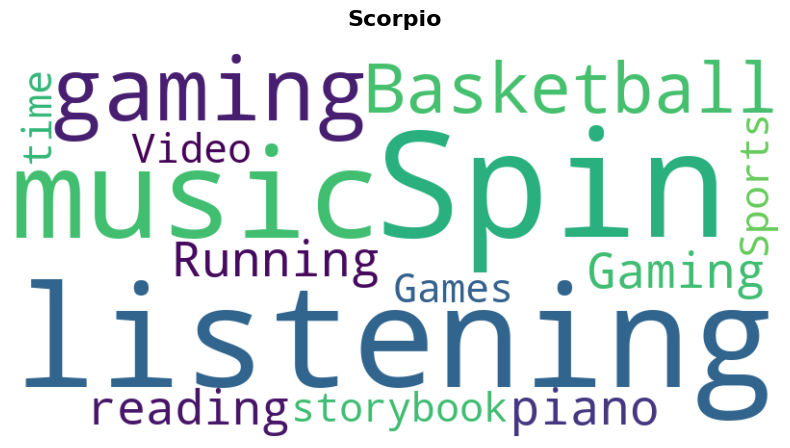

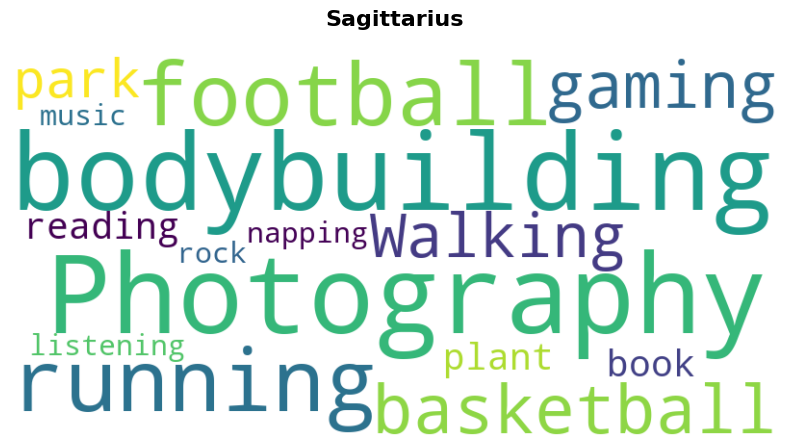

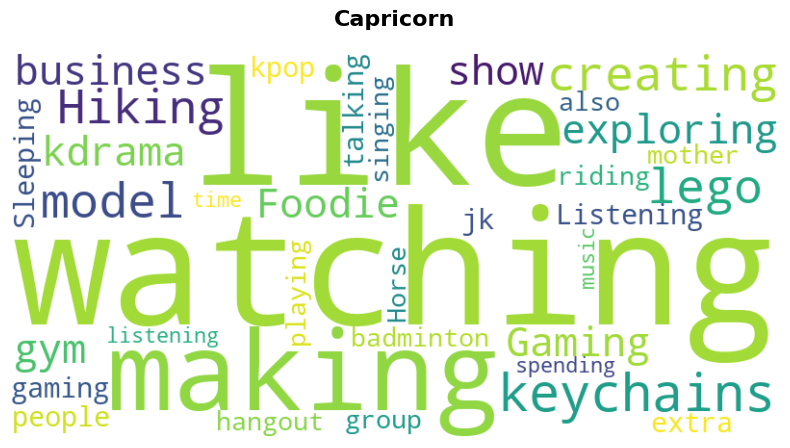

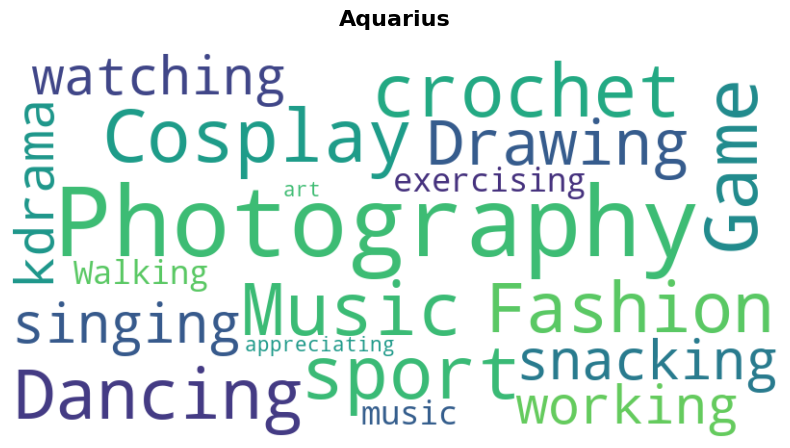

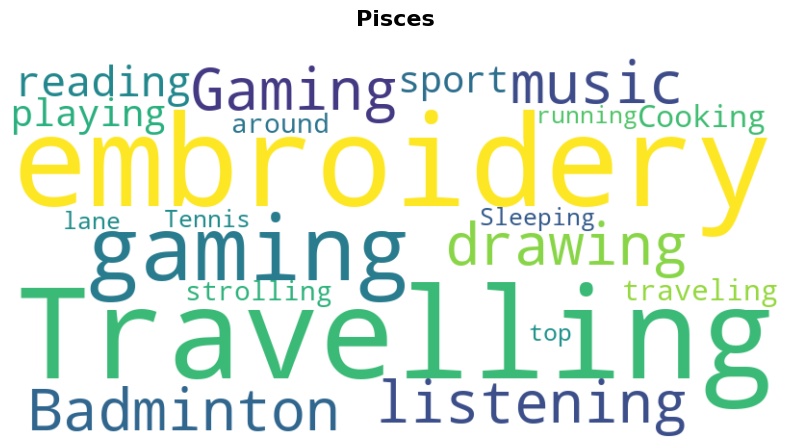

In [64]:
#filter by zodiac
for i in zodiac_sign:
    #filters the row based on zodiac sign
    filtered_rows = cleaned_survey_df[cleaned_survey_df["Zodiac Sign"].str.lower() == i]
    #changing the series to list
    list_data = filtered_rows["Hobbies"].tolist()
    combi_list_data = []
    for l in list_data:
        combi_list_data += l
    #count the frequency of each word
    word_freq = Counter(combi_list_data)
    #generate the word cloud
    wordcloud(word_freq)

#### Analysis:
There is strong alignment for Aries, Virgo and Sagittarius while there is partial alignments for Taurus, Cancer and Aquarius. The rest of the zodiac signs not mentioned are way too far off the zodiac sign prediction. Based on my observations, Many individual's hobbies like gaming and photography involve creative expression regardless of their zodiac signs. These reflects morden trends not captured in traditional zodiac profiles as many of the individual's hobbies are influenced by the morden times. An example would be gaming and watching drama.

## 4.2 Big Five Personality Traits Analysis
Now i will be analysing the questions using the big five personality traits (Extraversion, Agreeableness, Conscientiousness, Neurotism, Openness) using the cleaned survey data and compare it to zodiac profiling. 

I have created mapped survey question excel sheet to help allocate the points based on the answer. 
The big five personality traits include:
1. Extraversion (E): Sociability, energy in social settings and assertiveness.
2. Agreeableness (A): Kindness, cooperation, empathy, and interpersonal harmony.
3. Conscientiousness (C): Organization, responsibility, and work ethic.
4. Neuroticism (N): Emotional stability, anxiety, and response to stress.
5. Openness (O): Curiosity, creativity, and openness to new experiences.

I have assigned scores to each response:
- A: High Alignment with the trait(2 Points)
- B: Moderate Alignment with the trait
- C: Low Alignment with the trait

The table below will show which big personality trait I mapped to each question:
| **Question**                                                                                  | **Traits**         | **Why I chose this trait**                                              |
|-----------------------------------------------------------------------------------------------|--------------------|-------------------------------------------------------------------------|
| How do you typically feel in social situations (e.g., parties, gatherings)?                   | Extraversion       | It measures energy and social interaction tendencies.                    |
| Do you prefer spending time alone or with others?                                             | Extraversion       | Assesses preference between social interaction and solitude.             |
| How do you generally approach new experiences or challenges?                                  | Openness           | Evaluates willingness to embrace uncertainty and novel ideas.            |
| How do you feel when faced with stressful situations?                                         | Neuroticism        | Tests emotional response to stress and anxiety.                          |
| When something goes wrong, how do you usually react?                                          | Neuroticism        | Reflects emotional stability and the ability to recover from setbacks.   |
| How often do you feel a deep emotional connection to others (friends, family, pets)?          | Agreeableness      | Indicates empathy and emotional attachment to others.                    |
| When working on a project or task, how do you prefer to organize your time?                   | Conscientiousness  | Explores planning, structure, and time management.                       |
| How do you feel about competition?                                                            | Conscientiousness  | Reflects competitive drive and goal orientation.                         |
| Do you prefer to lead a team or work behind the scenes?                                       | Extraversion       | Assesses leadership preference and social assertiveness.                 |
| How do you handle conflicts with others?                                                     | Agreeableness      | Measures conflict resolution style and tendency towards harmony.         |
| When interacting with people, how likely are you to express your emotions openly?             | Extraversion       | Evaluates emotional expressiveness and sociability.                      |
| How do you feel about helping others, even when it’s inconvenient for you?                     | Agreeableness      | Tests willingness to prioritize others' needs over personal convenience. |
| How important is it for you to try new things (e.g., travel, hobbies, experiences)?           | Openness           | Measures curiosity and desire for variety and novelty.                   |
| When faced with a difficult problem, how do you usually solve it?                             | Openness           | Assesses creativity and preference for unconventional solutions.         |


I have decided to load the cleaned survey in as I will be changing the data alot and I do not want it to influence the previous dataframe

In [65]:
#loading cleaned survey data
response = pd.read_excel('cleanedSurveyData.xlsx')
#loading question-trait mapping
mapping = pd.read_excel('survey_mapping.xlsx')

In [66]:
response

,believe in horoscope,Zodiac Sign,Hobbies,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11,Q12,Q13,Q14,Personality,Value to relationship with others
0,No,Gemini,"['Painting', 'Gaming', 'Planning', 'Hangouts']",B,A,B,B,A,A,B,C,B,B,A,A,A,B,"['Bubbly', 'Ambivert', 'Loving']","['Quality', 'time', 'thoughtfulness']"
1,Yes,Cancer,"['Reading', 'playing', 'game']",B,B,C,C,B,A,C,B,C,B,B,B,B,A,"['Sensitive', 'romantic', 'caring']","['value', 'companionship', 'relationship']"
2,No,Aries,"['Gaming', 'parkour', 'exercise']",B,B,B,B,B,B,C,B,B,A,A,B,B,A,"['Loud', 'weird', 'annoying']",['Genuineness']
3,Yes,Cancer,"['Watching', 'movie']",B,C,B,B,B,B,B,A,C,B,B,B,B,B,"['Moody', 'caring', 'sensitive']",['Communication']
4,No,Pisces,"['Travelling', 'embroidery', 'gaming', 'listen...",B,B,B,C,B,B,B,C,C,C,B,B,B,B,"['Introverted', 'curious', 'indecisive']",['Trust']
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,No,Scorpio,"['Sports', 'time']",B,B,B,B,B,B,A,A,C,B,C,B,C,B,"['Go', 'flow']","['Quality', 'conversation']"
71,Yes,Taurus,['Crocheting'],B,B,C,C,B,B,B,B,B,B,B,B,B,B,"['Avoidance', 'Annoying', 'Conflicted']",['Loyalty']
72,No,Sagittarius,['napping'],A,B,B,B,A,B,B,B,B,B,B,B,A,B,"['crazy', 'loud']",['bond']
73,Yes,Libra,"['creative', 'work', 'chilling', 'friend', 'fa...",B,B,B,A,A,A,C,C,B,A,B,B,B,B,"['Creative', 'Calm', 'Quiet']","['Authentic', 'good', 'communication']"


In [67]:
mapping

,Question,Trait
0,Q1,Extraversion
1,Q2,Extraversion
2,Q3,Openness
3,Q4,Neuroticism
4,Q5,Neuroticism
5,Q6,Agreeableness
6,Q7,Conscientiousness
7,Q8,Conscientiousness
8,Q9,Extraversion
9,Q10,Agreeableness


### Score the survey response
I have decided to map the responses for the questions from alpheberts (A, B, C) to numbers based on the alphebert. This will allow me to do ANOVA and t-test analysis on the data as it requires numbers.
The function below will change A, B and C to points system for easier evaluations:

In [68]:
#List of question columns in the data
question_columns = [f'Q{i}' for i in range(1, 15)]

response_scores = {
    'A': 3,
    'B': 2,
    'C': 1
}
# Apply the mapping to each column
for col in question_columns:
    if col in response.columns:  # Check if the column exists
        response[col] = response[col].apply(lambda x: response_scores.get(x, 0) if isinstance(x, str) else 0)

In [69]:
response

,believe in horoscope,Zodiac Sign,Hobbies,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11,Q12,Q13,Q14,Personality,Value to relationship with others
0,No,Gemini,"['Painting', 'Gaming', 'Planning', 'Hangouts']",2,3,2,2,3,3,2,1,2,2,3,3,3,2,"['Bubbly', 'Ambivert', 'Loving']","['Quality', 'time', 'thoughtfulness']"
1,Yes,Cancer,"['Reading', 'playing', 'game']",2,2,1,1,2,3,1,2,1,2,2,2,2,3,"['Sensitive', 'romantic', 'caring']","['value', 'companionship', 'relationship']"
2,No,Aries,"['Gaming', 'parkour', 'exercise']",2,2,2,2,2,2,1,2,2,3,3,2,2,3,"['Loud', 'weird', 'annoying']",['Genuineness']
3,Yes,Cancer,"['Watching', 'movie']",2,1,2,2,2,2,2,3,1,2,2,2,2,2,"['Moody', 'caring', 'sensitive']",['Communication']
4,No,Pisces,"['Travelling', 'embroidery', 'gaming', 'listen...",2,2,2,1,2,2,2,1,1,1,2,2,2,2,"['Introverted', 'curious', 'indecisive']",['Trust']
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,No,Scorpio,"['Sports', 'time']",2,2,2,2,2,2,3,3,1,2,1,2,1,2,"['Go', 'flow']","['Quality', 'conversation']"
71,Yes,Taurus,['Crocheting'],2,2,1,1,2,2,2,2,2,2,2,2,2,2,"['Avoidance', 'Annoying', 'Conflicted']",['Loyalty']
72,No,Sagittarius,['napping'],3,2,2,2,3,2,2,2,2,2,2,2,3,2,"['crazy', 'loud']",['bond']
73,Yes,Libra,"['creative', 'work', 'chilling', 'friend', 'fa...",2,2,2,3,3,3,1,1,2,3,2,2,2,2,"['Creative', 'Calm', 'Quiet']","['Authentic', 'good', 'communication']"


The function below calculate the scores based on each of the five big personality:

In [70]:
def calculate_score(responses, mapping):
    scores = []
    for _, row in responses.iterrows():
        participant_score = {'Zodiac': row['Zodiac Sign']}
        for trait in ['Extraversion', 'Agreeableness', 'Conscientiousness', 'Neuroticism', 'Openness']:
            trait_questions = mapping[mapping['Trait'] == trait]['Question']
            trait_score = 0
            
            for q in trait_questions:
                #check if question exists in responses
                if q in responses.columns:
                    #default to 0 if value is missing or invalid
                    trait_score += row.get(q, 0) 
            participant_score[trait] = trait_score
        
        scores.append(participant_score)
    return pd.DataFrame(scores)


trait_scores = calculate_score(response, mapping)

In [71]:
trait_scores

,Zodiac,Extraversion,Agreeableness,Conscientiousness,Neuroticism,Openness
0,Gemini,10,8,3,5,7
1,Cancer,7,7,3,3,6
2,Aries,9,7,3,4,7
3,Cancer,6,6,5,4,6
4,Pisces,7,5,3,3,6
...,...,...,...,...,...,...
70,Scorpio,6,6,6,4,5
71,Taurus,8,6,4,3,5
72,Sagittarius,9,6,4,5,7
73,Libra,8,8,2,6,6


USE GRAPH AND SHOW RESULTS

In [72]:
zodiac_avg_scores = trait_scores.groupby('Zodiac').mean()
print(zodiac_avg_scores)

             Extraversion  Agreeableness  Conscientiousness  Neuroticism  \
Zodiac                                                                     
Aquarius         8.250000       7.000000           4.000000     4.625000   
Aries            7.200000       6.800000           3.600000     4.000000   
Cancer           7.111111       6.333333           3.444444     3.444444   
Capricorn        7.555556       6.111111           3.777778     4.111111   
Gemini           7.800000       6.400000           4.200000     4.600000   
Leo              6.800000       6.000000           3.800000     3.400000   
Libra            8.200000       7.600000           3.000000     4.600000   
Pisces           8.000000       6.500000           3.500000     4.166667   
Sagittarius      9.000000       6.750000           4.000000     4.500000   
Scorpio          6.166667       6.166667           3.833333     3.500000   
Taurus           7.727273       6.545455           4.181818     4.363636   
Virgo       

### Bar Graph to visualize the data
The function below shows the finding for the Big Five Personality

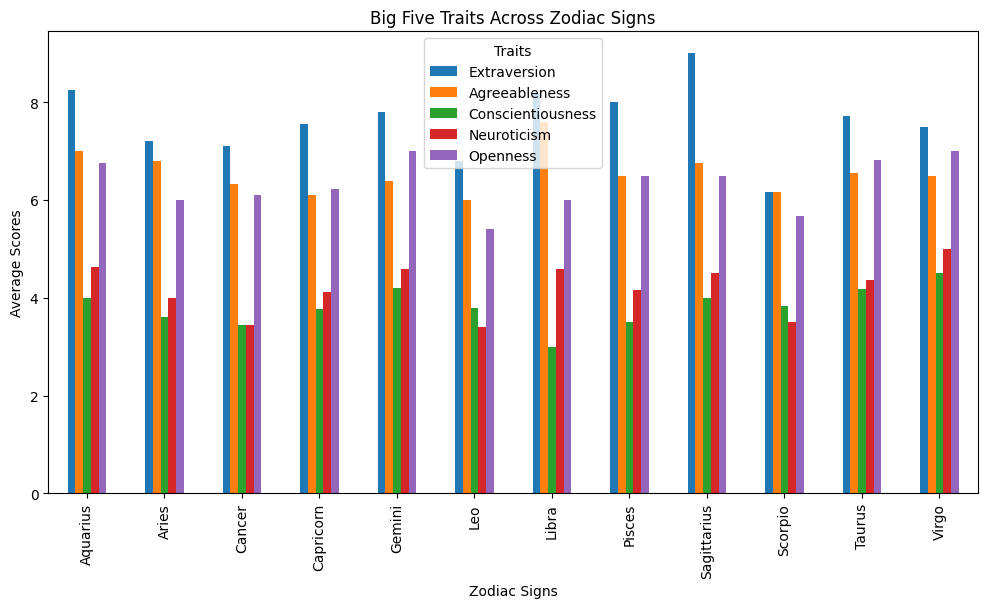

In [73]:
# Bar chart for traits across zodiac signs
zodiac_avg_scores[['Extraversion', 'Agreeableness', 'Conscientiousness', 'Neuroticism', 'Openness']].plot.bar(figsize=(12, 6))
plt.title('Big Five Traits Across Zodiac Signs')
plt.xlabel('Zodiac Signs')
plt.ylabel('Average Scores')
plt.legend(title="Traits")
plt.show()

#### Analysis:
This graph shows that there is no significant difference between the zodiac signs. I will try another graph to see if there is any significant difference

### Radar graph for specific signs
The function below creates a radar graph for a more indepth finding

In [74]:
from math import pi

def radar_chart(sign, avg_scores):
    categories = ['Extraversion', 'Agreeableness', 'Conscientiousness', 'Neuroticism', 'Openness']
    values = avg_scores.loc[sign, categories].values.flatten().tolist()
    values += values[:1]  # Repeat the first value for radar chart

    angles = [n / float(len(categories)) * 2 * pi for n in range(len(categories))]
    angles += angles[:1]

    plt.figure(figsize=(8, 8))
    ax = plt.subplot(111, polar=True)
    plt.xticks(angles[:-1], categories)

    ax.plot(angles, values, linewidth=2, linestyle='solid')
    ax.fill(angles, values, alpha=0.4)
    plt.title(f'Big Five Personality Traits: {sign}')
    plt.show()

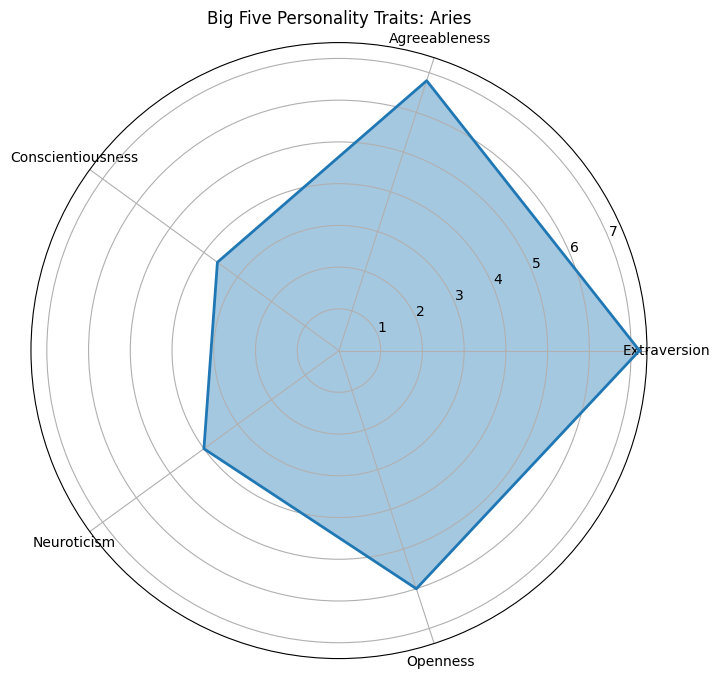

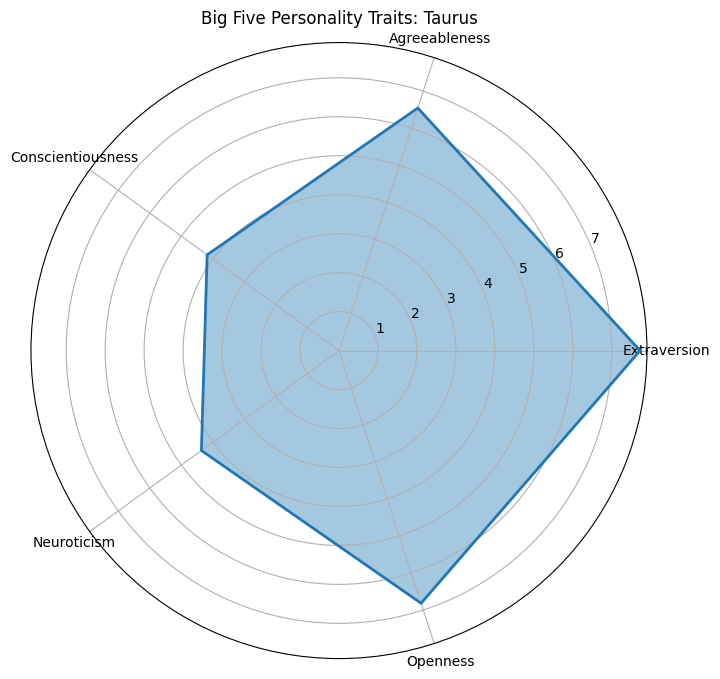

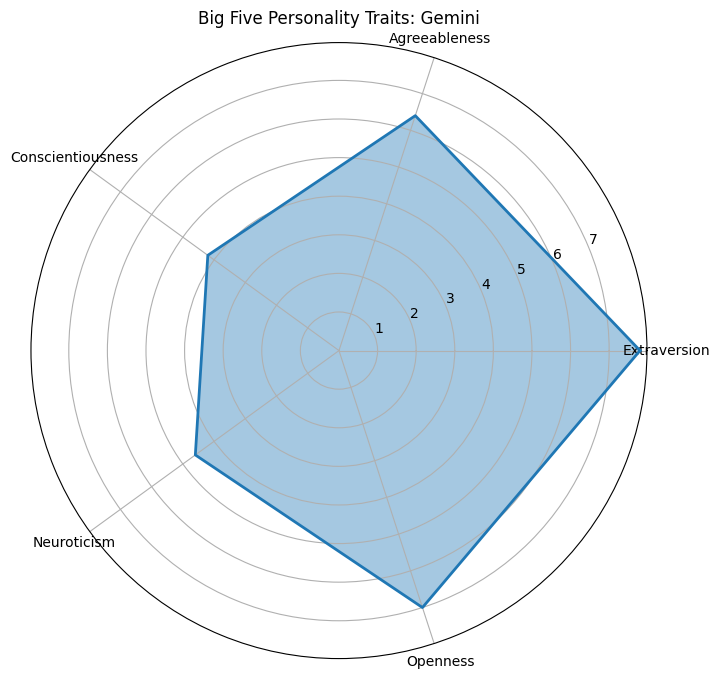

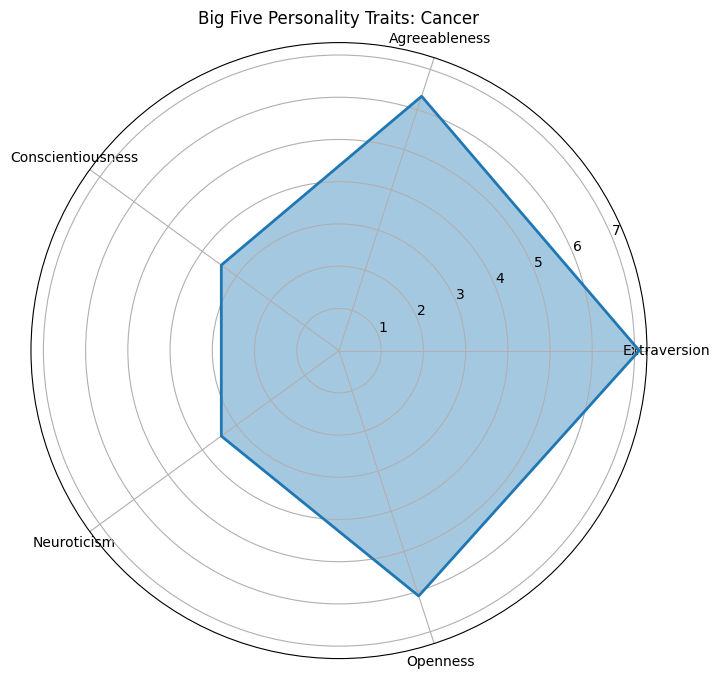

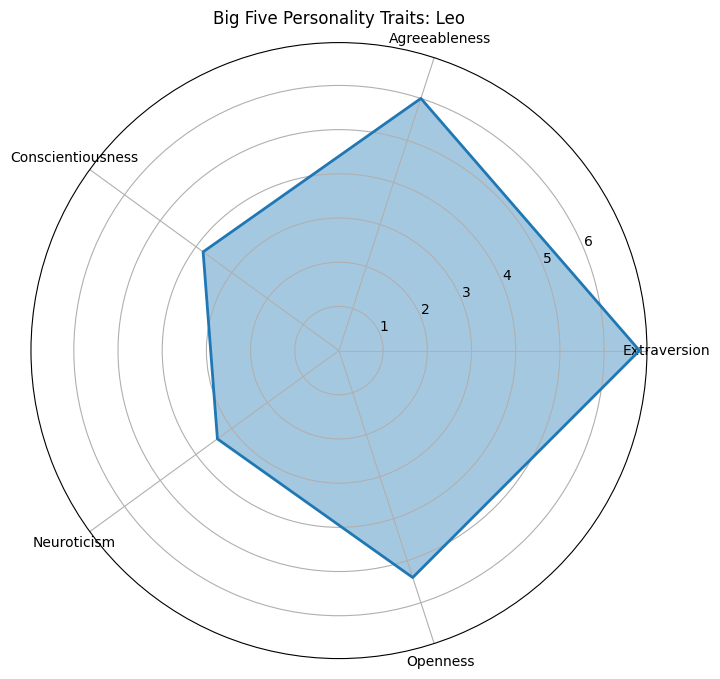

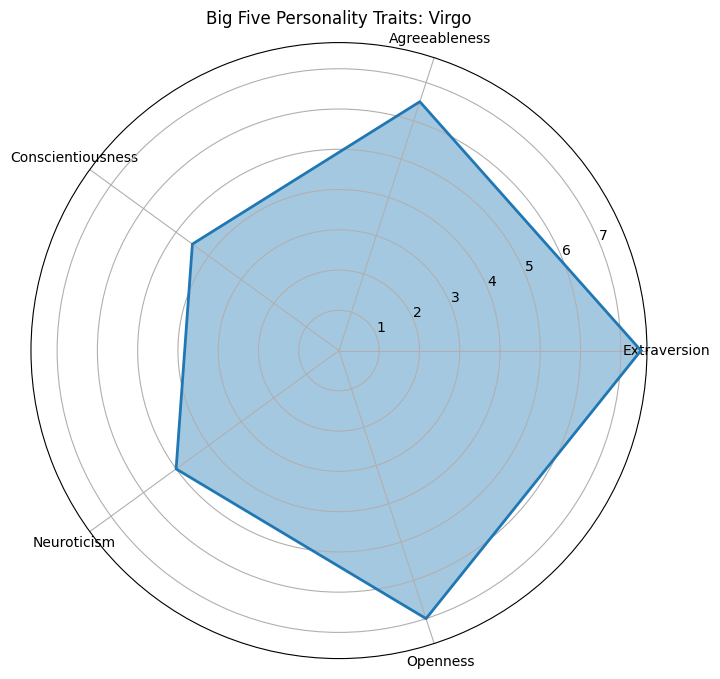

In [75]:
# Radar chart for Aries
radar_chart('Aries', zodiac_avg_scores)

# Radar chart for Taurus
radar_chart('Taurus', zodiac_avg_scores)

# Radar chart for Gemini
radar_chart('Gemini', zodiac_avg_scores)

# Radar chart for Cancer
radar_chart('Cancer', zodiac_avg_scores)

# Radar chart for Leo
radar_chart('Leo', zodiac_avg_scores)

# Radar chart for Virgo
radar_chart('Virgo', zodiac_avg_scores)

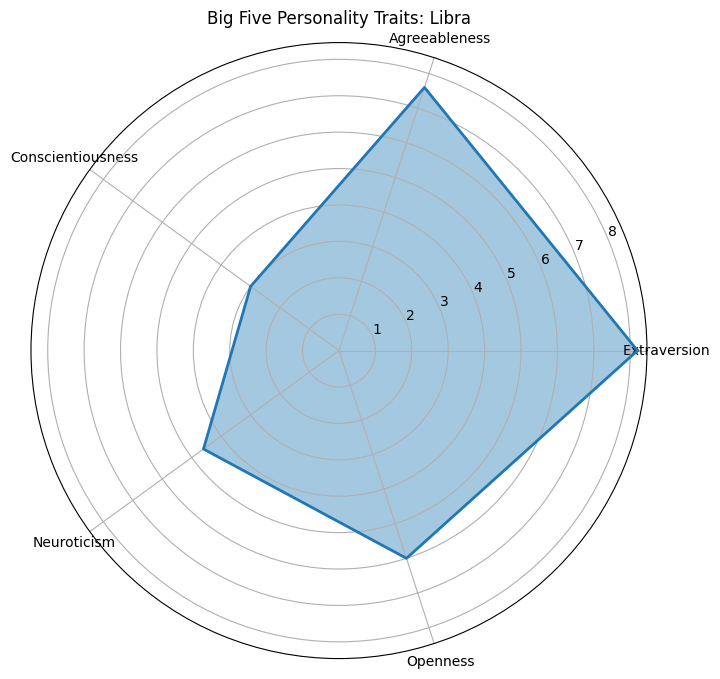

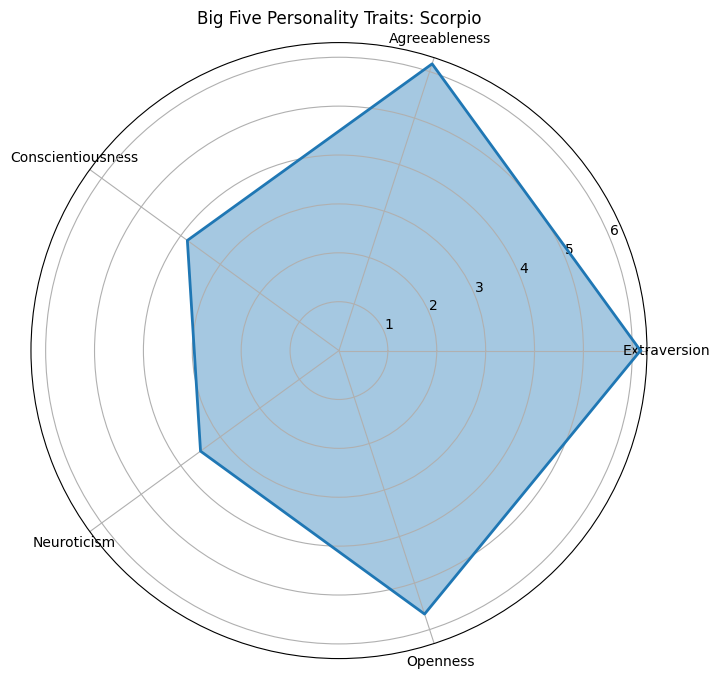

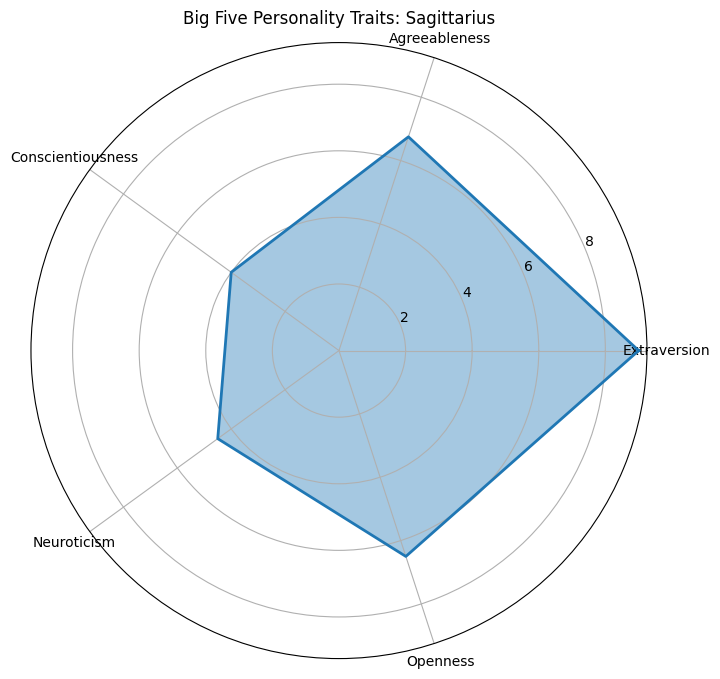

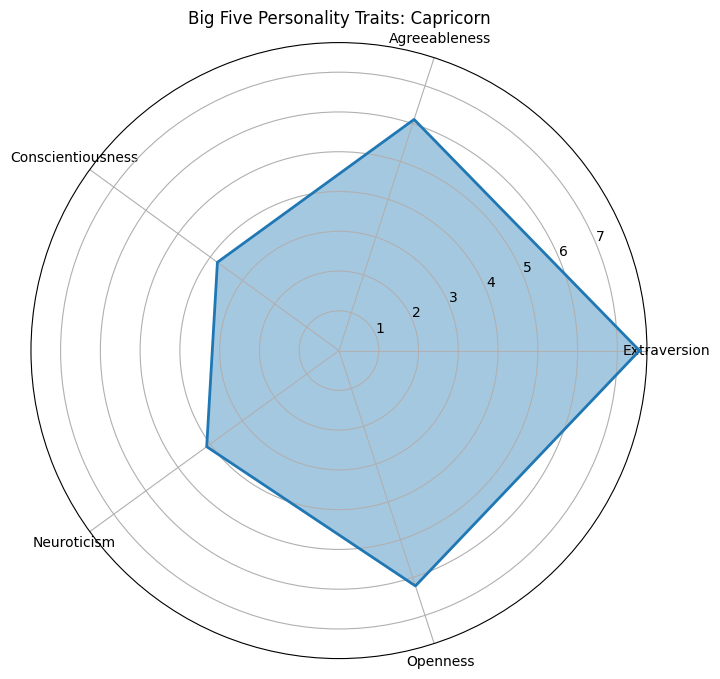

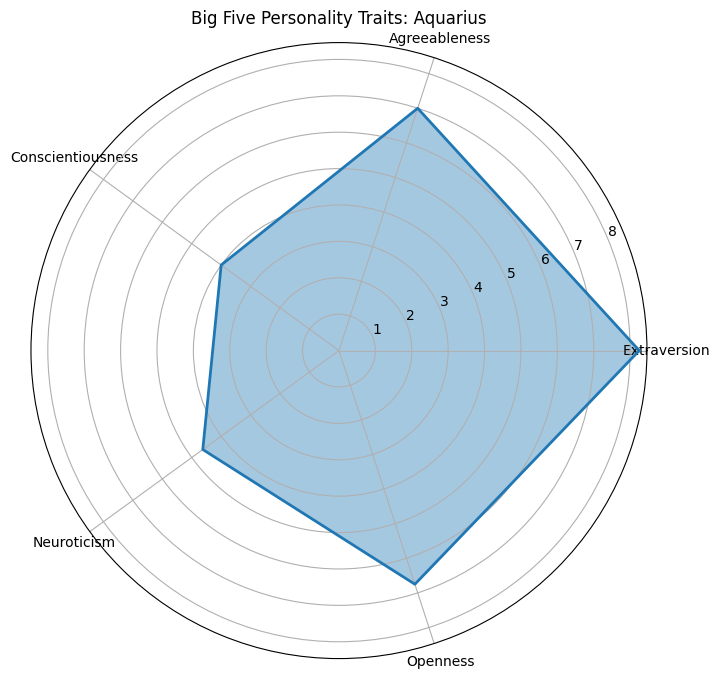

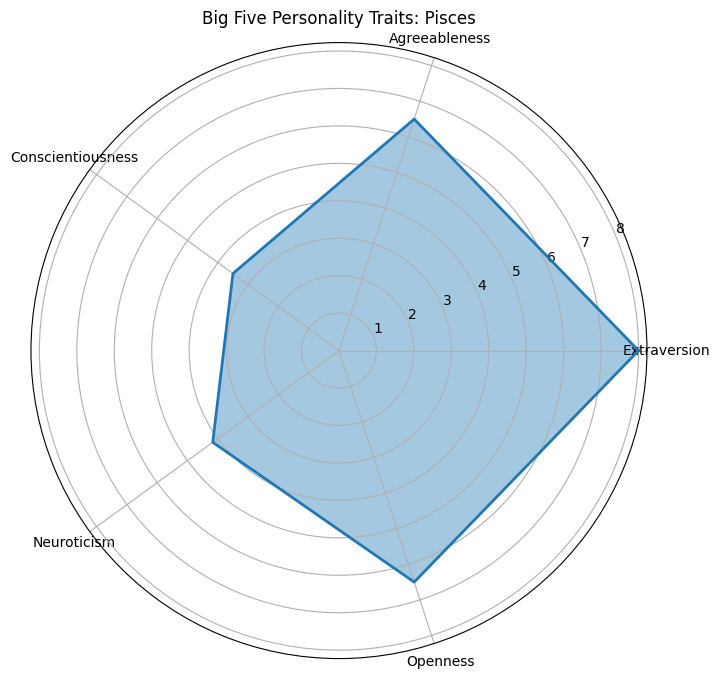

In [76]:
# Radar chart for Libra
radar_chart('Libra', zodiac_avg_scores)

# Radar chart for Scorpio
radar_chart('Scorpio', zodiac_avg_scores)

# Radar chart for Sagittarius
radar_chart('Sagittarius', zodiac_avg_scores)

# Radar chart for Capricorn
radar_chart('Capricorn', zodiac_avg_scores)

# Radar chart for Aquarius
radar_chart('Aquarius', zodiac_avg_scores)

# Radar chart for Pisces
radar_chart('Pisces', zodiac_avg_scores)

#### Analysis:
This graph shows that there is little to no significant difference between the zodiac signs. I will now try stasitical analysis to see if it yields any significant findings.

## 4.3 Statistical Analysis
### Using ANOVA to test if there's a significant difference in trait scores across zodiac signs.

In [77]:
print("ANOVA Test")
for trait in ['Extraversion', 'Agreeableness', 'Conscientiousness', 'Neuroticism', 'Openness']:
    groups = [trait_scores[trait_scores['Zodiac'] == sign][trait] for sign in trait_scores['Zodiac'].unique()]
    f_stat, p_value = f_oneway(*groups)
    print(f"{trait}: F-statistic = {f_stat:.2f}, p-value = {p_value:.3f}")


ANOVA Test
Extraversion: F-statistic = 1.30, p-value = 0.248
Agreeableness: F-statistic = 0.90, p-value = 0.549
Conscientiousness: F-statistic = 0.74, p-value = 0.694
Neuroticism: F-statistic = 1.77, p-value = 0.079
Openness: F-statistic = 1.09, p-value = 0.386


#### Analysis:
From the results, none of the traits have a p-value below the standard p lesser than 0.05, indicating that none significantly predict the outcome variable in this analysis. neuroticism p-value is the closest to statistical significance which indicates it might have a marginal effect worth exploring further. The F-statistics are low across the traits, implying that their contributions to explaining the variance in the outcome are minimal. Therefore, these results shows that the Big Five personality traits do not meaningfully explain the variance in the real time personality outcome variable.

### Using t-tests for pairwise comparison between specific zodiac groups
The function below shows the correlation between Zodiac and Traits

In [78]:
# Encode Zodiac Signs
le = LabelEncoder()
trait_scores['Zodiac_Encoded'] = le.fit_transform(trait_scores['Zodiac'])

# Correlation test
print("t-test")
for trait in ['Extraversion', 'Agreeableness', 'Conscientiousness', 'Neuroticism', 'Openness']:
    corr, p_val = spearmanr(trait_scores['Zodiac_Encoded'], trait_scores[trait])
    print(f"{trait}: Correlation = {corr:.2f}, p-value = {p_val:.3f}")

t-test
Extraversion: Correlation = -0.03, p-value = 0.769
Agreeableness: Correlation = -0.05, p-value = 0.640
Conscientiousness: Correlation = 0.11, p-value = 0.334
Neuroticism: Correlation = 0.07, p-value = 0.563
Openness: Correlation = 0.09, p-value = 0.465


#### Analysis:
the stength of the relationship between the Big Five personality is weak as all the correlations are weak (all the lower than 0.2), suggesting that none of the traits can strongly predict the outcome variable. None of the p-value are below 0.05, indicating that none of the correlations are statistically significant. The results are consistent with random chance, this means that there is no clear evidence of meaningful relationships between these traits and the outcome. Therefore, this suggests that the Big Five personality traits have minimal influence on individuals in real life personality.

## 4.4 Percentage of zodiac signs in the population
### Percentage of zodiac in the World Population
I am going to add up the total amount of repsonses for each zodiac sign

In [79]:
#count the occurrences of each unique value in the 'Category' column
count = cleaned_survey_df['Zodiac Sign'].value_counts()

# Define custom order
custom_order = ['Aries','Taurus', 'Gemini', 'Cancer', 'Leo', 'Virgo', 'Libra', 'Scorpio', 'Sagittarius', 'Capricorn', 'Aquarius', 'Pisces']

# Reindex the counts to follow the custom order
count_custom_order = count.reindex(custom_order)
print(count_custom_order)

percentage_list = []
for i in cleaned_df['% of population']:
    percentage_list.append(i)

int_list = [float(num) for num in percentage_list]

Zodiac Sign
Aries           5
Taurus         11
Gemini          5
Cancer          9
Leo             5
Virgo           2
Libra           5
Scorpio         6
Sagittarius     4
Capricorn       9
Aquarius        8
Pisces          6
Name: count, dtype: int64


### Pie Chart for the distribution of the zodiac signs in a population

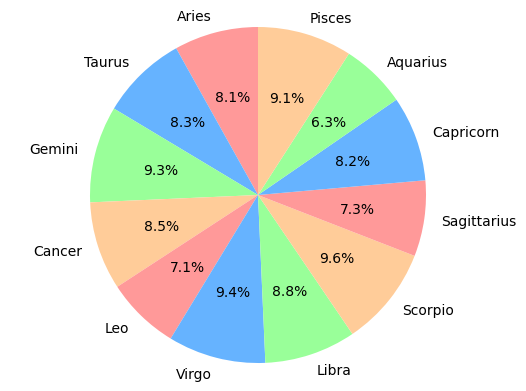

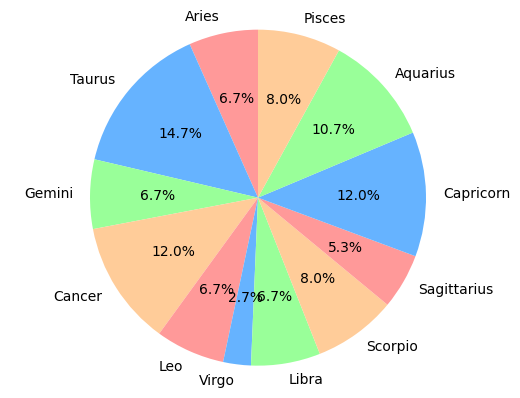

In [80]:
#plotting a pie chart for the survey data
plt.pie(int_list, labels=custom_order, autopct='%1.1f%%', startangle=90, colors=['#ff9999', '#66b3ff', '#99ff99', '#ffcc99'])

#equal aspect ratio ensures the pie is drawn as a circle
plt.axis('equal')

#display the chart
plt.show()

#plotting a pie chart for the survey data
plt.pie(count_custom_order, labels=custom_order, autopct='%1.1f%%', startangle=90, colors=['#ff9999', '#66b3ff', '#99ff99', '#ffcc99'])

#equal aspect ratio ensures the pie is drawn as a circle
plt.axis('equal')

#display the chart
plt.show()

#### Analysis:
The pie chart shows that there is some difference between each zodiac sign but it looks unclear. I will use another graph to visualize the data better.

### Bar Graph for the distribution of the zodiac signs in a population

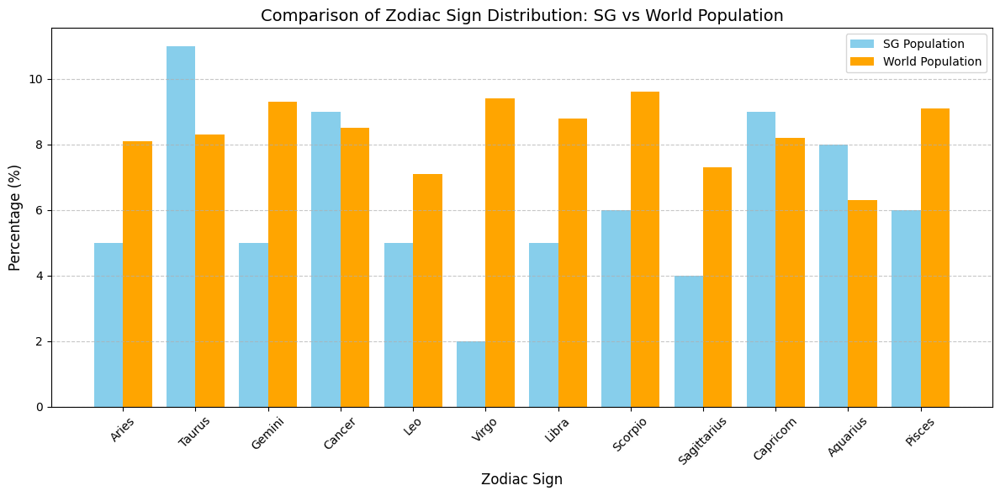

In [81]:
# Plotting the bar graph
plt.figure(figsize=(12, 6))  # Set figure size

# Bar positions
x = range(len(cleaned_df['Zodiac Sign']))
bar_width = 0.4  # Width of each bar

# Plot bars for SG and World populations
plt.bar([p - bar_width / 2 for p in x], count_custom_order, width=bar_width, label='SG Population', color='skyblue')
plt.bar([p + bar_width / 2 for p in x], int_list, width=bar_width, label='World Population', color='orange')

# Adding labels and title
plt.xlabel('Zodiac Sign', fontsize=12)
plt.ylabel('Percentage (%)', fontsize=12)
plt.title('Comparison of Zodiac Sign Distribution: SG vs World Population', fontsize=14)
plt.xticks(x, cleaned_df['Zodiac Sign'], rotation=45)  # Add zodiac names as x-axis labels
plt.legend()  # Add legend
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Optional: Add gridlines for easier reading

# Display the plot
plt.tight_layout()
plt.show()

#### Analysis:
the Zodiac sign distribution in Singapore differs significantly from the global pattern in several areas. For example, Taurus and Capricorn are notably overrepresented compared to the global averages, indicating the potential cultural or seasonal factors influencing birth rates. Whereas, Virgo is super underrepresented which suggests that there are specific demographic or temporal birth trends in Singapore. Some signs like Aries and Libra, shows similiarity between both population which highlights certain zodiac signs unique regional influences on birth distribution 

## 4.5 Percentage of individual's belief in horoscopes

In [82]:
#count the occurrences of each unique value in the 'Category' column
count = cleaned_survey_df['believe in horoscope'].value_counts()

#display the result
print(count)

believe in horoscope
No     40
Yes    35
Name: count, dtype: int64


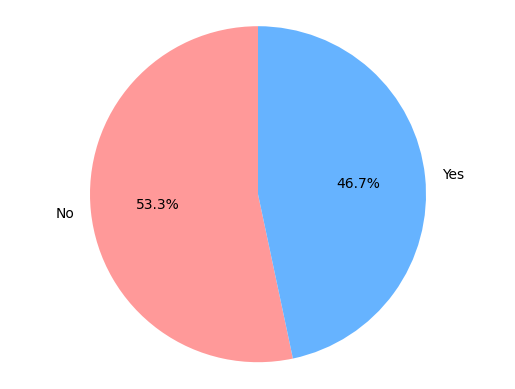

In [83]:
#plotting a pie chart using the 'Value' column
plt.pie(count, labels=['No', 'Yes'], autopct='%1.1f%%', startangle=90, colors=['#ff9999', '#66b3ff', '#99ff99', '#ffcc99'])

#equal aspect ratio ensures the pie is drawn as a circle
plt.axis('equal')

#display the chart
plt.show()

#### Analysis:
<p>53.3% of respondents answered "No", showing that they do not believe in horoscopes. This suggests that skepticism or disbelief in astrology is prevalent.</p>
<p>The other 46.7% of respondancts answered "Yes", showing that nearly half the people believe in horoscopes. This suggests that belief in horoscopes still holds considerable popularity and cultural significance.</p>
<p>The result of this pie chart shows a close split. It shows a near-end divide, indicating mxied perspectives on astrology. This might be caused by other factors like cultural, generational or personal factors.</p>


# 5 Summary
## 5.1 Conclusion
These analysis reveals that while zodiac sign profiling provides a base framework for understanding personality traits and hobbies. The alignment with real-life characteristics is inconsistent. This could be because of the mordern trend and the zodiac sign profiling is not up to date, it is still following traditional trend. Many individuals gravitate towards creative and widely popular mordern activities like gaming, photography, or watching kdrama across all zodiac signs. The belief in astrology shows a near 50/50 split between believers and skeptics which shows the ongoing cultural and generational debate surrounding astrology. 

<p>In conclusion, zodiac profiling predictive power is limited and heavily influenced by cultural and generational factors, astrology still holds a place in society as a psychological tool. The ongoing popularity of astrology reflects its ability to provide meaning in an increasingly complex society. However, the limitations in predictive capabilities of personality and hobbies proves that it can only be used as a interpretive guideline. </p>



## 6.2 References
<p>[1] Webscrapping lecture and lab, Dr Julian Lin</p>
<p>[2] pypi (Jan 18, 2024). Beautifulsoup4 available: https://beautiful-soup-4.readthedocs.io/en/latest/</p>
<p>[3] Natural Language Processing lab, Dr Julian Lin</p>
<p>[4] w3school - python machine learning preprocessing available: https://www.w3schools.com/python/python_ml_preprocessing.asp</p>
<p>[5] Eden Leavey and Clara Martinez (February 16, 2022). Students explore influence of zodiac signs on individuality. Available: https://standard.asl.org/19666/arts/students-explore-influence-of-zodiac-signs-on-individuality/</p>


In [1]:
# RSA padded message: "0002" + 109 bytes of "AA" + "00" + "ComputerSecurity" in hex
header = "0002"
padding = "AA" * 109
separator = "00"
message = "436F6D70757465725365637572697479"  # "ComputerSecurity"

# Full hex string
full_hex = header + padding + separator + message

# Convert to decimal
decimal_value = int(full_hex, 16)

print("Decimal value:")
print(decimal_value)

Decimal value of the padded message:
7314832091724918244341248334916279026765856847909776093482669317941596509012897262886900932715150391484379633783829482326610911816992863870965471624327560399485998267613341686047453597055912032855350055016479726922125271905210891987057011333855274949680603462100621467902405953015283425277425802264802425
